# COSC2779 Assignment 2
Kah Hie TOH


In [ ]:
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE

# A dependency of the preprocessing for BERT inputs
!pip install -q -U tensorflow-text

!pip install -q tf-models-official

import os
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optimizer
tf.get_logger().setLevel('ERROR')

# Import and Load Data
Before any analysis of the data is done, the data will be loaded from Google Drive to the Notebook.

In [ ]:
# Mounting google drive to Notebook
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Extract the zip file containing the dataset
!cp -r /content/drive/StanceDataset.zip .
!unzip -q -o StanceDataset.zip
!rm StanceDataset.zip
!ls
# !ls should show the directory `StanceDataset` present in the zip file

drive  __MACOSX  sample_data  StanceDataset


In [ ]:
import os

DIR = 'StanceDataset'
os.listdir(DIR)

['test.csv', 'train.csv']

From above, it can be seen that the dataset comes in form of CSV files and the test data has already been created. Let's take a look at the training dataset and testing dataset.

In [ ]:
import pandas as pd
import chardet


train_dir = os.path.join(DIR,'train.csv')
test_dir = os.path.join(DIR, 'test.csv')

train_csv = pd.read_csv(train_dir, encoding='unicode_escape',lineterminator='\r')
test_csv = pd.read_csv(test_dir, encoding='unicode_escape',lineterminator='\r')

train_csv

,Tweet,Target,Stance,Opinion Towards,Sentiment
0,"@tedcruz And, #HandOverTheServer she wiped cle...",Hillary Clinton,AGAINST,1. The tweet explicitly expresses opinion abo...,neg
1,Hillary is our best choice if we truly want to...,Hillary Clinton,FAVOR,1. The tweet explicitly expresses opinion abo...,pos
2,@TheView I think our country is ready for a fe...,Hillary Clinton,AGAINST,1. The tweet explicitly expresses opinion abo...,neg
3,I just gave an unhealthy amount of my hard-ear...,Hillary Clinton,AGAINST,1. The tweet explicitly expresses opinion abo...,neg
4,@PortiaABoulger Thank you for adding me to you...,Hillary Clinton,NONE,3. The tweet is not explicitly expressing opi...,pos
...,...,...,...,...,...
2909,"There's a law protecting unborn eagles, but no...",Legalization of Abortion,AGAINST,1. The tweet explicitly expresses opinion abo...,neg
2910,I am 1 in 3... I have had an abortion #Abortio...,Legalization of Abortion,AGAINST,2. The tweet does NOT expresses opinion about ...,other
2911,How dare you say my sexual preference is a cho...,Legalization of Abortion,AGAINST,2. The tweet does NOT expresses opinion about ...,neg
2912,"Equal rights for those 'born that way', no rig...",Legalization of Abortion,AGAINST,2. The tweet does NOT expresses opinion about ...,neg


In [ ]:
train_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2914 entries, 0 to 2913
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Tweet            2914 non-null   object
 1   Target           2914 non-null   object
 2   Stance           2914 non-null   object
 3   Opinion Towards  2914 non-null   object
 4   Sentiment        2914 non-null   object
dtypes: object(5)
memory usage: 114.0+ KB


From above, it can be safely said that there are no missing values across all columns.

# Exploratory Data Analysis
EDA will be performed on the training dataset to learn more about the data.

From the databset above, it can be seen that there are a total of 2914 rows of data and there are a total of 5 columns present, including the tweet itself, the target, the stance as well as sentiment.
The sentiment as well as the stance is in categorical form. There are no missing values.

## Columns
EDA will first be performed on the columns including:  
- Number of data across different columns
- Relation between different columns

### Target
The `Target` shows the topic that the tweet is about. Let's take a look at the number of tweets or data across different Targets.



[[Text(0, 0, '707'),
  Text(0, 0, '295'),
  Text(0, 0, '285'),
  Text(0, 0, '280'),
  Text(0, 0, '220'),
  Text(0, 0, '169')]]

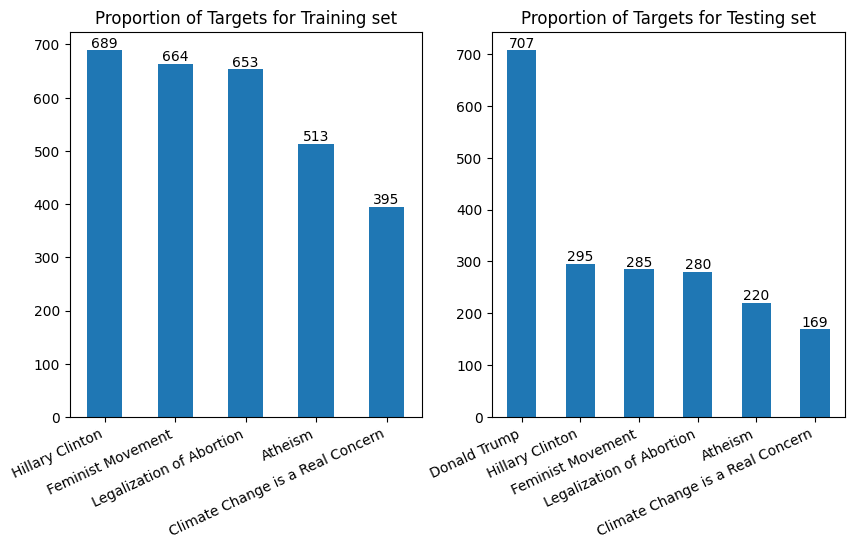

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
# Plot histogram of the number of data across different Targets
target_bar_train = train_csv['Target'].value_counts().plot(kind='bar')
plt.xticks(rotation=25,ha='right')
plt.title('Proportion of Targets for Training set')

plt.subplot(1,2,2)
target_bar_test = test_csv['Target'].value_counts().plot(kind='bar')
plt.xticks(rotation=25,ha='right')
plt.title('Proportion of Targets for Testing set')

[target_bar_train.bar_label(container) for container in target_bar_train.containers]
[target_bar_test.bar_label(container) for container in target_bar_test.containers]

From above, it is surprising to see that the training and testing set have different number of Targets, with the testing set having an extra Target 'Donald Trump'. This suggests that the model would need to learn about the Target column as well, rather than just treating it as a categorical variable.

For the training set, it can be seen that the data distribution across different Target is fairly balanced. However, this does not take into account the proportion of different stances of the tweets.

Since the Targets are quite long, let's do a quick annotation to prevent having to keep mentioning the full Target name:  

**Target 1 - HC**: Hillary Clinton  
**Target 2 - FM**: Feminist Movement  
**Target 3 - LA**: Legalization of Abortion  
**Target 4 - AT**: Atheism  
**Target 5 - CC**: Climate Change is a Real Concern  
**Target 6 - DT**: Donald Trump

### Stance
`Stance` shows whether the tweet conveys an opinion towards the `Target`.

Text(0.5, 1.0, 'Number of data across different Stance\non Testing set')

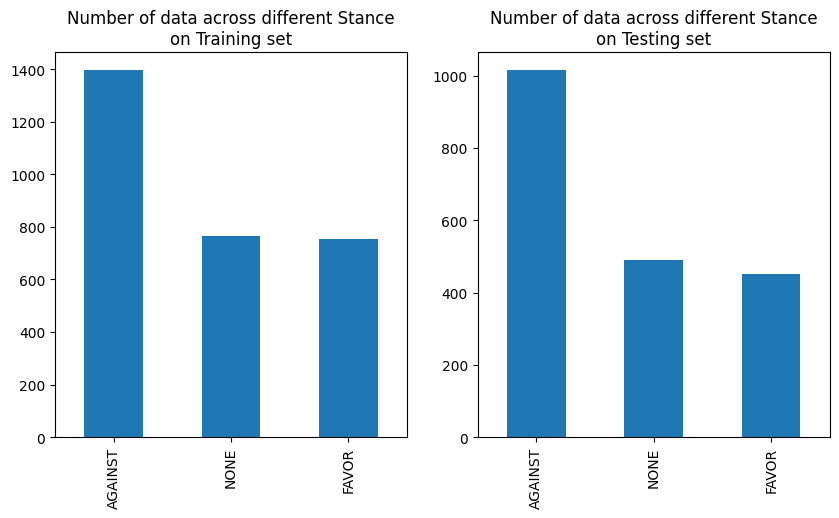

In [ ]:
# Plot histogram of the number of data across different Stances
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
train_csv['Stance'].value_counts().plot(kind='bar')
plt.title('Number of data across different Stance\non Training set')

plt.subplot(1,2,2)
test_csv['Stance'].value_counts().plot(kind='bar')
plt.title('Number of data across different Stance\non Testing set')

From above, it can be seen that a majority of the data conveys the AGAINST stance towards its Target. This shows a slight data imbalance in the training dataset. With that, let's take a deeper dive into the dataset by checking the proportion of different stances across different Targets.

In [ ]:
# pd.crosstab creates a simple cross tabulation of 2 or more factors
tar_sta = pd.crosstab(train_csv['Target'], train_csv['Stance'])
tar_sta_test = pd.crosstab(test_csv['Target'], test_csv['Stance'])


# Sort dataset by sum of rows
tar_sta['sum'] = tar_sta.sum(axis=1)
tar_sta = tar_sta.sort_values("sum", ascending=False)
tar_sta = tar_sta.drop('sum',axis=1)

tar_sta_test['sum'] = tar_sta_test.sum(axis=1)
tar_sta_test = tar_sta_test.sort_values("sum", ascending=False)
tar_sta_test = tar_sta_test.drop('sum',axis=1)

In [ ]:
# Function to get the percentage of data across the dataset in strings
def get_count_per(series, df):
  totals = df['Target'].value_counts().values
  labels = []

  for ind,value in enumerate(series.values):
    percentage = str(np.round(value/totals[ind]*100,1))
    label = str(value) + "\n" + percentage +"%"
    labels.append(label)

  return labels

  # count = series
  # percentage = np.round(series.values/totals*100,2)
  # return []

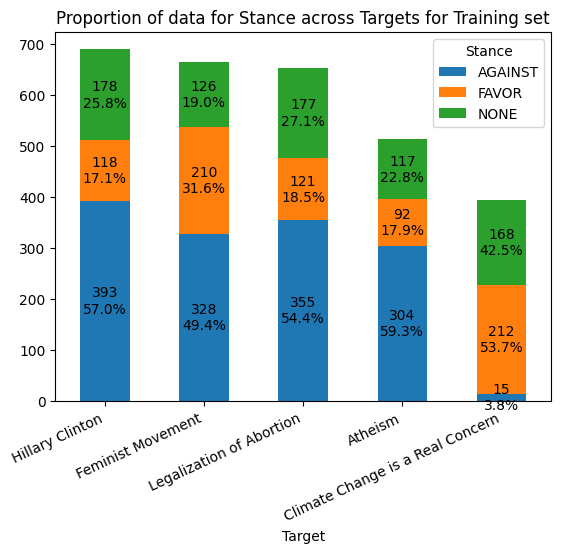

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

tar_sta_bar = tar_sta.plot.bar(stacked=True)

plt.title("Proportion of data for Stance across Targets for Training set")
plt.xticks(rotation=25, ha='right')


# Get percentage for different Stance Target combination
labels = [get_count_per(tar_sta[col], train_csv) for col in tar_sta.columns.values]
# labels = [[str(per) for per in nested] for nested in labels]

# Label the bars
for ind,container in enumerate(tar_sta_bar.containers):
  tar_sta_bar.bar_label(container,labels=labels[ind],label_type='center')

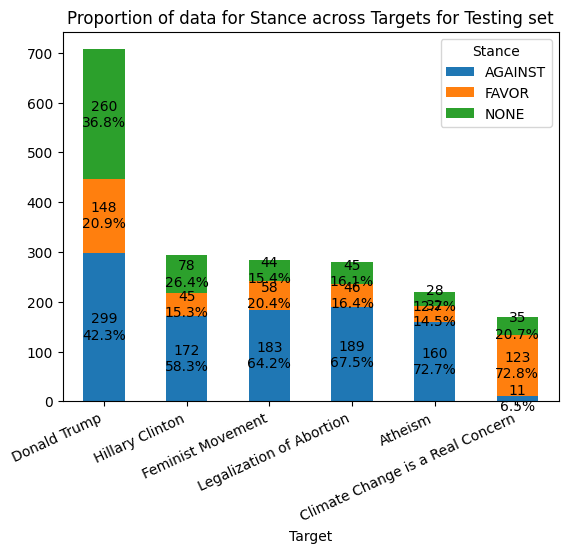

In [ ]:
tar_sta_bar = tar_sta_test.plot.bar(stacked=True)

plt.title("Proportion of data for Stance across Targets for Testing set")
plt.xticks(rotation=25, ha='right')

labels = [get_count_per(tar_sta_test[col], test_csv) for col in tar_sta_test.columns.values]

for ind,container in enumerate(tar_sta_bar.containers):
  tar_sta_bar.bar_label(container,labels=labels[ind],label_type='center')

From above, it can be seen that for Targets except for `Target 5 CC`, a majority of the data conveys a negative stance towards the Target, with the remaining split across the remaining stances in a not so equal manner as well. There is only a total of 15 data out of all 2,914 data within the dataset that presents a negative stance towards `Target 5 CC`, this is also a similar case in the testing set. This poses a very difficult problem for the model to learn.

The chart above is evident that the dataset is very biased and imbalanced.

### Opinion Towards
Let's take a look into the type of values for this column. The testing set will be skipped.

Text(0.5, 1.0, 'Number of data across different Opinion Towards')

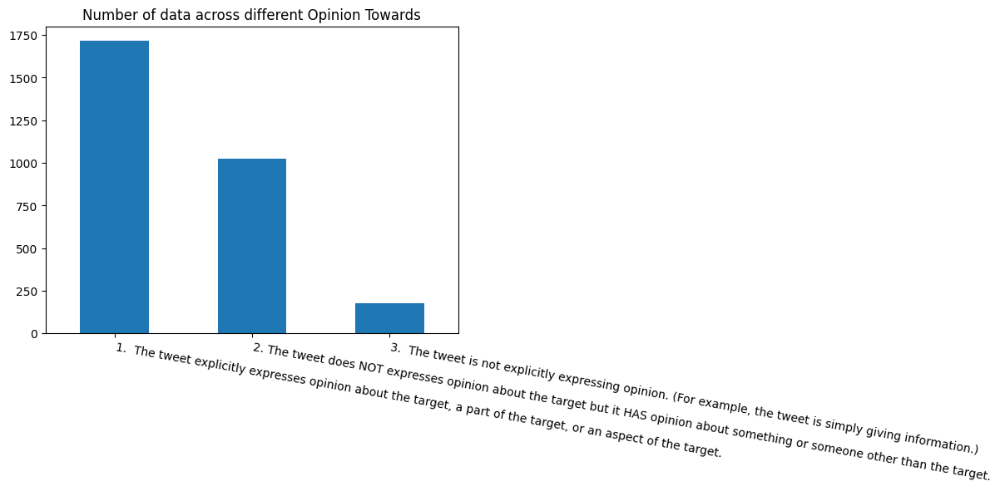

In [ ]:
train_csv['Opinion Towards'].value_counts().plot(kind='bar')
plt.xticks(rotation=-10,ha='left')
plt.title("Number of data across different Opinion Towards")

It can be seen that majority of the data are of Opinion Towards 1 and 2, with a noticeably reduced amount of data for Opinion Towards 3.

From the descriptions, it shows that OT 1 and 2 labels tweet that provides an opinion (to or not to the Target) while OT 3 shows a neutral tweet. Based on that, it seems like this column could be related to the column *Stance*. Let's take a look to see if there is any correlation.

Text(0.5, 1.0, 'Proportion of data of different Stance across different Opinion Towards')

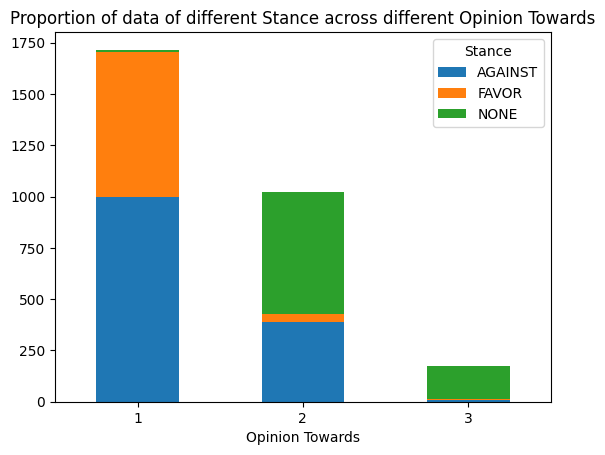

In [ ]:
# Short form of the OTs
short_opinions = {'1.  The tweet explicitly expresses opinion about the target, a part of the target, or an aspect of the target.':'1',
                  '2. The tweet does NOT expresses opinion about the target but it HAS opinion about something or someone other than the target.':'2',
                  '3.  The tweet is not explicitly expressing opinion. (For example, the tweet is simply giving information.)':'3'

}

sta_ot = pd.crosstab(train_csv['Opinion Towards'], train_csv['Stance'])
sta_ot_bar = sta_ot.plot.bar(stacked=True)
plt.xticks(rotation=0)
sta_ot_bar.set_xticklabels(short_opinions.values())
plt.title('Proportion of data of different Stance across different Opinion Towards')

From above, it can be seen that for OT1, there is minimal number of data with the NONE stance. On the other hand, OT2 contains more data with NONE and AGAINST stance with minimal data on FAVOR stance. Lastly, there's minimal data on both AGAINST and FAVOR stance for OT3.

From the very imbalanced distribution, there is a concern that considering this column during training might cause data leakage. For example, the model could predict all Stance as NONE for tweets of OT3, which could increase the performance of the model for predicting the NONE Stance. Thus, this column will not be considered during training.

### Sentiment
The Sentiment column shows whether the tweet conveys any emotion towards the Target

Text(0.5, 1.0, 'Number of data across different Sentiments')

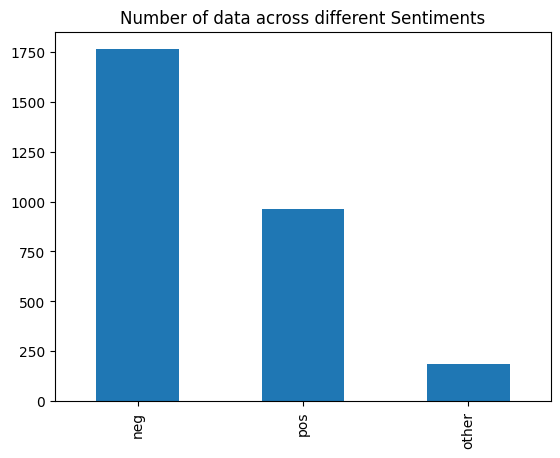

In [ ]:
train_csv['Sentiment'].value_counts().plot(kind='bar')
# plt.xticks(rotation=-10,ha='left')
plt.title("Number of data across different Sentiments")

Yet again, the amount of data for the different Sentiment is also very imbalanced. Let's take a look at the proportion of different Stance across different Sentiment

Text(0.5, 1.0, 'Proportion of data of different Stance across different Sentiment')

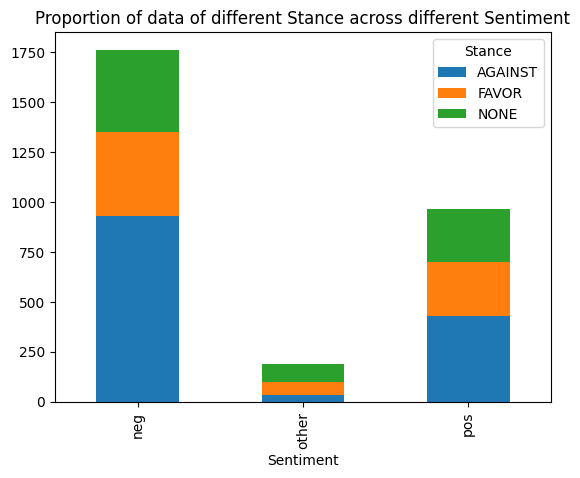

In [ ]:
sta_sen = pd.crosstab(train_csv['Sentiment'], train_csv['Stance'])
sta_sen.plot.bar(stacked=True)
plt.title('Proportion of data of different Stance across different Sentiment')

From above, it can be seen that the different Stances are nearly equally distributed across different Sentiments. This also means that sentiment of a tweet does not indicate the stance of that tweet. Thus, they will not be included into training. With that, let's now look at the tweets themselves.

## Tweets
Certain components of the tweets will be examined to grasp the data the model will be trained on.

### Number of words
Looking at the number of words on average for different targets could gauge the vocabulary size we are dealing with.

In [ ]:
import re
# Training Set
word_count = []
words = []
for tweet in train_csv['Tweet']:
  # Get all words from the tweet uncased
  word = re.findall(r'\w+', tweet.lower())
  words.append(word)
  word_count.append(len(word))

train_csv['word_count'] = word_count
train_csv['words'] = words


print("Total words: ", train_csv['word_count'].sum())
train_csv.groupby('Target')['word_count'].describe()

Total words:  51583


,count,mean,std,min,25%,50%,75%,max
Target,,,,,,,,
Atheism,513.0,18.699805,4.965461,7.0,15.0,19.0,23.0,32.0
Climate Change is a Real Concern,395.0,16.721519,4.506444,7.0,13.0,17.0,20.0,28.0
Feminist Movement,664.0,18.254518,4.801644,6.0,15.0,19.0,22.0,30.0
Hillary Clinton,689.0,16.756168,4.679408,7.0,13.0,17.0,20.0,27.0
Legalization of Abortion,653.0,17.946401,4.946202,6.0,14.0,18.0,22.0,33.0


In [ ]:
# Test Set

word_count = []
words = []
for tweet in test_csv['Tweet']:
  # word = tweet.split(' ')
  word = re.findall(r'\w+', tweet.lower())
  words.append(word)
  word_count.append(len(word))

test_csv['word_count'] = word_count
test_csv['words'] = words

print("Total words: ", test_csv['word_count'].sum())
test_csv.groupby('Target')['word_count'].describe()

Total words:  34274


,count,mean,std,min,25%,50%,75%,max
Target,,,,,,,,
Atheism,220.0,18.113636,5.123212,7.0,14.0,18.0,22.0,31.0
Climate Change is a Real Concern,169.0,17.136095,4.270518,8.0,14.0,18.0,20.0,26.0
Donald Trump,707.0,17.190948,4.996206,6.0,13.0,18.0,21.0,28.0
Feminist Movement,285.0,18.021053,4.898934,7.0,15.0,19.0,21.0,31.0
Hillary Clinton,295.0,17.305085,4.085207,7.0,15.0,17.0,20.0,29.0
Legalization of Abortion,280.0,17.850000,4.753305,7.0,15.0,18.0,21.0,28.0


From above, it can be seen that most tweets have a word count ranging from 16 to 18. This is true for both the training and testing sets. There are a total of around 51k words in the training set and 34k words in the testing set, which is not a lot.

### Number of Unique Words : Vocabulary Size

In [ ]:
train_unique_words = set()
[[train_unique_words.update(words) for word in words] for words in train_csv['words']]

print("Training Vocabulary Size:",len(train_unique_words))

Training Vocabulary Size: 9212


In [ ]:
test_unique_words = set()
[[test_unique_words.update(words) for word in words] for words in test_csv['words']]

print("Testing Vocabulary Size:",len(test_unique_words))

Testing Vocabulary Size: 7101


From above, it can be seen that the vocabulary size is tolerable, with around 9k unique words. There are less words present in the testing set, which could be of help in training as there may be less new words that the model did not get to learn during training.

### Words in Test set but not in Training set
It is interesting to see the amout of vocabulary present in the testing set that is not present in the testing set to see how different the testing set is to the training set.

In [ ]:
diff_words = test_unique_words - train_unique_words

print("Testing Unique Words Size:",len(diff_words))

Testing Unique Words Size: 3786


From above, it can be seen that there are around 3k words that are only present in the testing set. This poses a problem if the model were to be trained using Word2Vec as Word2Vec will not be able to handle out-of-vocabulary words, making the use of BERT models even more viable as BERT models have no such problem.

## Duplicated tweets
It is crucial to make sure that there are no tweets that are present in both the training and testing set to prevent any data leakage.

In [ ]:
train_csv[train_csv['Tweet'].duplicated()]

,Tweet,Target,Stance,Opinion Towards,Sentiment,word_count,words


In [ ]:
test_csv[test_csv['Tweet'].duplicated()]

,Tweet,Target,Stance,Opinion Towards,Sentiment,word_count,words


In [ ]:
for tweet in test_csv['Tweet'].unique():
  if tweet in train_csv['Tweet'].unique():
    print(tweet)

From above, it can be seen that there are no duplicates and intersecting tweets present in the dataset. Thus, it is stated that there will be no data leakage.

### Non-English words
Considering that the data consists of tweets, it is assumed that it would contain components such as mentions("@someone"), hashtages("#hashtag") as well as emojis and other non-English symbols. Let's take at look at them.

#### Hashtags

In [ ]:
train_csv['Target'].unique()

array(['Hillary Clinton', 'Legalization of Abortion', 'Atheism',
       'Climate Change is a Real Concern', 'Feminist Movement'],
      dtype=object)

In [ ]:
import re
# import pprint
from collections import Counter
from collections import defaultdict

hash_counter = defaultdict(Counter)

hashtag_pattern = r'#\w+'
train_csv['hashtags'] = train_csv['Tweet'].apply(lambda x: re.findall(hashtag_pattern,x))

# For loop to update the Counter object
# For different hashtags under different Target
for row in train_csv[['Target','hashtags']].itertuples():
  for hashtag in list(row.hashtags):
    hash_counter[row.Target][hashtag] += 1


# hash_counter.most_common(5)
hash_counter = Counter(hash_counter)

for key in hash_counter.keys():
  print("Number of unique hashtags for Target",key + ":",len(hash_counter[key].values()))
  n = 5
  label = "Top " + str(n) + " common hashtags for Target " + key + ":"
  print(label)
  [print(item+":",str(count)) for item,count in hash_counter[key].most_common(5)]
  print()

Number of unique hashtags for Target Hillary Clinton: 478
Top 5 common hashtags for Target Hillary Clinton:
#SemST: 639
#WakeUpAmerica: 33
#HillaryClinton: 31
#tcot: 22
#Benghazi: 16

Number of unique hashtags for Target Legalization of Abortion: 539
Top 5 common hashtags for Target Legalization of Abortion:
#SemST: 603
#ProLifeYouth: 24
#SCOTUS: 18
#LoveWins: 14
#AllLivesMatter: 10

Number of unique hashtags for Target Atheism: 493
Top 5 common hashtags for Target Atheism:
#SemST: 513
#God: 38
#LoveWins: 17
#islam: 15
#freethinker: 14

Number of unique hashtags for Target Climate Change is a Real Concern: 475
Top 5 common hashtags for Target Climate Change is a Real Concern:
#SemST: 395
#Mission: 12
#Climate: 12
#Tip: 12
#peace: 11

Number of unique hashtags for Target Feminist Movement: 394
Top 5 common hashtags for Target Feminist Movement:
#SemST: 664
#GamerGate: 56
#YesAllWomen: 21
#feminist: 20
#SpankAFeminist: 11



From above, it can be seen that the hashtag #SemST is common across all Targets to the point that all tweets of Target `CC`, `FM` as well as `AT` had that specific hashtag. Thus, it is deduced that this hashtag is used for tweeters to post tweets to this specific competition or form. With that hashtag eliminated, it can be seen that the same hashtags are not frequently used across tweets, most with less than 35 occurence across different Targets.

#### Mentions

In [ ]:
mention_counter = defaultdict(Counter)

mention_pattern = r'@\w+'
train_csv['mentions'] = train_csv['Tweet'].apply(lambda x: re.findall(mention_pattern,x))

for row in train_csv[['Target','mentions']].itertuples():
  for mention in list(row.mentions):
    mention_counter[row.Target][mention] += 1


mention_counter = Counter(mention_counter)

for key in mention_counter.keys():
  print("Number of unique hashtags for Target",key + ":",len(mention_counter[key].values()))
  n = 5
  label = "Top " + str(n) + " common hashtags for Target " + key + ":"
  print(label)
  [print(item+":",str(count)) for item,count in mention_counter[key].most_common(5)]
  print()

Number of unique hashtags for Target Hillary Clinton: 402
Top 5 common hashtags for Target Hillary Clinton:
@HillaryClinton: 135
@billclinton: 15
@POTUS: 15
@FoxNews: 8
@GOP: 8

Number of unique hashtags for Target Legalization of Abortion: 275
Top 5 common hashtags for Target Legalization of Abortion:
@ProLifeYouth: 5
@JustinTrudeau: 4
@LifeNewsHQ: 4
@WildChild69: 4
@LogicOfLife7: 4

Number of unique hashtags for Target Atheism: 140
Top 5 common hashtags for Target Atheism:
@prayerbullets: 9
@xfranman: 3
@RichardDawkins: 2
@dhiggins63: 2
@PvtFraser: 2

Number of unique hashtags for Target Climate Change is a Real Concern: 227
Top 5 common hashtags for Target Climate Change is a Real Concern:
@POTUS: 8
@BarackObama: 5
@EPA: 3
@manupulgarvidal: 3
@WhiteHouse: 2

Number of unique hashtags for Target Feminist Movement: 296
Top 5 common hashtags for Target Feminist Movement:
@cooImemegirl: 7
@PennyRed: 6
@WeNeedFeminism: 3
@TC_Stompa: 3
@brigadam: 3



From above, it can be seen that for Target HC, there is a considerable number of occurence for the mention @HillaryClinton. Other than that, there are minimal occurence of any mention the remaining Targets.

####Non-English Symbols
With both the hashtags and mentions analyzed, it is time to extract the different symbols present in the tweets.

In [ ]:
# symbol_pattern = r'\d'
# emojis_pattern = u'[\U0001F1E6-\U0001F1FF]'
non_english_pattern = "[^\u0000-\u05C0\u2100-\u214F]+"
train_csv['symbols'] = train_csv['Tweet'].apply(lambda x: re.findall(non_english_pattern,x))
test_csv['symbols'] = train_csv['Tweet'].apply(lambda x: re.findall(non_english_pattern,x))
# train_csv['symbols'].unique()

print("Emojis in training set:",set(train_csv['symbols'].sum()))
print("Emojis in testing set:",set(test_csv['symbols'].sum()))

Emojis in training set: set()
Emojis in testing set: set()


From above, it appears that there are no non-English characters present in the training as well as testing dataset. This indicates that some form of data cleaning may have been done prior by the dataset generators.

# Data Splitting & Pre-processing
As the dataset is heavily imbalanced, several measurs will be taken including  
1. Stratification - to ensure that the validation set contains data of each Target and Stance combination
2. Undersampling & Oversampling - to balance the number of data for different Target Stance combinations in the training set

## Stratification

In [ ]:
# Add a column that shows the Target Stance combination of the data
train_csv['topic_stance'] = train_csv.apply(lambda x : x.Target + ", " + x.Stance, axis=1)
train_csv.head()

,Tweet,Target,Stance,Opinion Towards,Sentiment,word_count,words,hashtags,mentions,symbols,topic_stance
0,"@tedcruz And, #HandOverTheServer she wiped cle...",Hillary Clinton,AGAINST,1. The tweet explicitly expresses opinion abo...,neg,18,"[tedcruz, and, handovertheserver, she, wiped, ...","[#HandOverTheServer, #Benghazi, #tcot]",[@tedcruz],[],"Hillary Clinton, AGAINST"
1,Hillary is our best choice if we truly want to...,Hillary Clinton,FAVOR,1. The tweet explicitly expresses opinion abo...,pos,16,"[hillary, is, our, best, choice, if, we, truly...",[#Ohio],[],[],"Hillary Clinton, FAVOR"
2,@TheView I think our country is ready for a fe...,Hillary Clinton,AGAINST,1. The tweet explicitly expresses opinion abo...,neg,17,"[theview, i, think, our, country, is, ready, f...",[],[@TheView],[],"Hillary Clinton, AGAINST"
3,I just gave an unhealthy amount of my hard-ear...,Hillary Clinton,AGAINST,1. The tweet explicitly expresses opinion abo...,neg,20,"[i, just, gave, an, unhealthy, amount, of, my,...",[#WhyImNotVotingForHillary],[],[],"Hillary Clinton, AGAINST"
4,@PortiaABoulger Thank you for adding me to you...,Hillary Clinton,NONE,3. The tweet is not explicitly expressing opi...,pos,9,"[portiaaboulger, thank, you, for, adding, me, ...",[],[@PortiaABoulger],[],"Hillary Clinton, NONE"


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
test = test_csv.copy()

Text(0.5, 1.0, 'Proportion of Targets for Training and Validation Set')

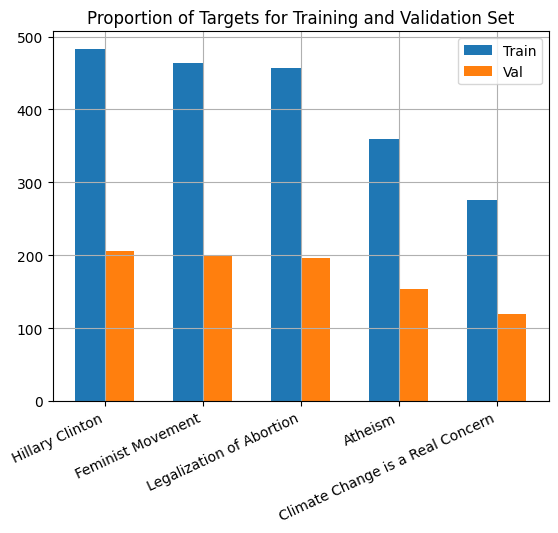

In [ ]:
import imblearn
from sklearn.model_selection import train_test_split

train, val = train_test_split(train_csv,
                              stratify=train_csv['topic_stance'],
                              test_size=0.3,
                              random_state=845)

targets = train['Target'].value_counts().keys()
ind = np.arange(len(targets))
width = 0.3
train_bar = plt.bar(ind-width, train['Target'].value_counts(),width, align='edge', label='Train')
val_bar = plt.bar(ind, val['Target'].value_counts(),width, align='edge', label="Val")
plt.xticks(ind, targets, rotation=25, ha='right')
plt.grid()
plt.legend()
plt.title("Proportion of Targets for Training and Validation Set")

From above, it can be seen that the stratification is successful, where the training and validation dataset have identical distributions.

## Oversampling & Undersampling
All of the combination of Target Stance will have the same amount of data to create a balanced dataset. The amount to sample will be the average data for all Target Stance combinations.

In [ ]:
import imblearn
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [ ]:
train_ori = train.copy()
# val_ori = val.copy()

In [ ]:
train_ori['topic_stance'].value_counts()

Hillary Clinton, AGAINST                     275
Legalization of Abortion, AGAINST            248
Feminist Movement, AGAINST                   229
Atheism, AGAINST                             213
Climate Change is a Real Concern, FAVOR      148
Feminist Movement, FAVOR                     147
Hillary Clinton, NONE                        125
Legalization of Abortion, NONE               124
Climate Change is a Real Concern, NONE       118
Feminist Movement, NONE                       88
Legalization of Abortion, FAVOR               85
Hillary Clinton, FAVOR                        83
Atheism, NONE                                 82
Atheism, FAVOR                                64
Climate Change is a Real Concern, AGAINST     10
Name: topic_stance, dtype: int64

In [ ]:
train['topic_stance'].unique()

average = len(train['topic_stance'])/len(train['topic_stance'].unique())
average = int(average)
print(average,"data to sample")

# Get Target Stance combinations that is
# larger than the average for undersampling
ts_count = train['topic_stance'].value_counts()
undersampling_ts = ts_count[ts_count >= average]
undersampling_ts

135 data to sample


Hillary Clinton, AGAINST                   275
Legalization of Abortion, AGAINST          248
Feminist Movement, AGAINST                 229
Atheism, AGAINST                           213
Climate Change is a Real Concern, FAVOR    148
Feminist Movement, FAVOR                   147
Name: topic_stance, dtype: int64

In [ ]:
# Get Target Stance combinations that is
# smaller than the average for oversampling
oversampling_ts = ts_count[ts_count < average]
oversampling_ts

Hillary Clinton, NONE                        125
Legalization of Abortion, NONE               124
Climate Change is a Real Concern, NONE       118
Feminist Movement, NONE                       88
Legalization of Abortion, FAVOR               85
Hillary Clinton, FAVOR                        83
Atheism, NONE                                 82
Atheism, FAVOR                                64
Climate Change is a Real Concern, AGAINST     10
Name: topic_stance, dtype: int64

In [ ]:
# Initialize the oversampling and undersampling strategy
oversampling_strat = dict.fromkeys(oversampling_ts.keys(),average)
undersampling_strat = dict.fromkeys(undersampling_ts.keys(),average)

In [ ]:
# Get all data that has the Target Stance combination from the undersampling dict
unders_df = train[train['topic_stance'].isin(list(undersampling_strat.keys()))]
unders_df['topic_stance'].value_counts()

Hillary Clinton, AGAINST                   275
Legalization of Abortion, AGAINST          248
Feminist Movement, AGAINST                 229
Atheism, AGAINST                           213
Climate Change is a Real Concern, FAVOR    148
Feminist Movement, FAVOR                   147
Name: topic_stance, dtype: int64

In [ ]:
# Get all data that has the Target Stance combination from the oversampling dict
overs_df = train[train['topic_stance'].isin(list(oversampling_strat.keys()))]
overs_df['topic_stance'].value_counts()

Hillary Clinton, NONE                        125
Legalization of Abortion, NONE               124
Climate Change is a Real Concern, NONE       118
Feminist Movement, NONE                       88
Legalization of Abortion, FAVOR               85
Hillary Clinton, FAVOR                        83
Atheism, NONE                                 82
Atheism, FAVOR                                64
Climate Change is a Real Concern, AGAINST     10
Name: topic_stance, dtype: int64

In [ ]:
# Initialize the oversampler and undersampler
oversampler = RandomOverSampler(sampling_strategy=oversampling_strat, random_state=932)
undersampler = RandomUnderSampler(sampling_strategy=undersampling_strat, random_state=36)

# Oversample lacking data
os_tar_sta,os_tar_sta_y = oversampler.fit_resample(overs_df,overs_df['topic_stance'])
os_tar_sta['topic_stance'].value_counts()

/usr/local/lib/python3.10/dist-packages/imblearn/utils/_validation.py:313: UserWarning: After over-sampling, the number of samples (135) in class Hillary Clinton, NONE will be larger than the number of samples in the majority class (class #Hillary Clinton, NONE -> 125)
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/imblearn/utils/_validation.py:313: UserWarning: After over-sampling, the number of samples (135) in class Legalization of Abortion, NONE will be larger than the number of samples in the majority class (class #Hillary Clinton, NONE -> 125)
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/imblearn/utils/_validation.py:313: UserWarning: After over-sampling, the number of samples (135) in class Climate Change is a Real Concern, NONE will be larger than the number of samples in the majority class (class #Hillary Clinton, NONE -> 125)
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/imblearn/utils/_validation.py:313: UserWarning: After over-sampling, the 

Hillary Clinton, NONE                        135
Atheism, FAVOR                               135
Hillary Clinton, FAVOR                       135
Climate Change is a Real Concern, NONE       135
Feminist Movement, NONE                      135
Atheism, NONE                                135
Legalization of Abortion, NONE               135
Climate Change is a Real Concern, AGAINST    135
Legalization of Abortion, FAVOR              135
Name: topic_stance, dtype: int64

In [ ]:
# Oversample major data
us_tar_sta,us_tar_sta_y = undersampler.fit_resample(unders_df,unders_df['topic_stance'])
us_tar_sta['topic_stance'].value_counts()

Atheism, AGAINST                           135
Climate Change is a Real Concern, FAVOR    135
Feminist Movement, AGAINST                 135
Feminist Movement, FAVOR                   135
Hillary Clinton, AGAINST                   135
Legalization of Abortion, AGAINST          135
Name: topic_stance, dtype: int64

In [ ]:
# Join the oversampled and undersampled data
train = pd.concat([os_tar_sta,us_tar_sta])

# Get the number of training data for all Target Stance combination
train['topic_stance'].value_counts()

Hillary Clinton, NONE                        135
Atheism, FAVOR                               135
Hillary Clinton, FAVOR                       135
Climate Change is a Real Concern, NONE       135
Feminist Movement, NONE                      135
Atheism, NONE                                135
Legalization of Abortion, NONE               135
Climate Change is a Real Concern, AGAINST    135
Legalization of Abortion, FAVOR              135
Atheism, AGAINST                             135
Climate Change is a Real Concern, FAVOR      135
Feminist Movement, AGAINST                   135
Feminist Movement, FAVOR                     135
Hillary Clinton, AGAINST                     135
Legalization of Abortion, AGAINST            135
Name: topic_stance, dtype: int64

In [ ]:
# Get the number of testing data for all Target Stance combination
val['topic_stance'].value_counts()

Hillary Clinton, AGAINST                     118
Legalization of Abortion, AGAINST            107
Feminist Movement, AGAINST                    99
Atheism, AGAINST                              91
Climate Change is a Real Concern, FAVOR       64
Feminist Movement, FAVOR                      63
Legalization of Abortion, NONE                53
Hillary Clinton, NONE                         53
Climate Change is a Real Concern, NONE        50
Feminist Movement, NONE                       38
Legalization of Abortion, FAVOR               36
Hillary Clinton, FAVOR                        35
Atheism, NONE                                 35
Atheism, FAVOR                                28
Climate Change is a Real Concern, AGAINST      5
Name: topic_stance, dtype: int64

In [ ]:
train = train.reset_index(drop=True)
val = val.reset_index(drop=True)

In [ ]:
train

,Tweet,Target,Stance,Opinion Towards,Sentiment,word_count,words,hashtags,mentions,symbols,topic_stance
0,@GOP Obamacare stays and the Confederate flag ...,Hillary Clinton,NONE,2. The tweet does NOT expresses opinion about ...,neg,20,"[gop, obamacare, stays, and, the, confederate,...",[#SemST],[@GOP],[],"Hillary Clinton, NONE"
1,Getting good at biting my tongue with my total...,Atheism,FAVOR,1. The tweet explicitly expresses opinion abo...,neg,22,"[getting, good, at, biting, my, tongue, with, ...",[#SemST],[],[],"Atheism, FAVOR"
2,Casually hangin' with @HillaryClinton on a con...,Hillary Clinton,FAVOR,1. The tweet explicitly expresses opinion abo...,pos,15,"[casually, hangin, with, hillaryclinton, on, a...","[#ACUHOI, #SemST]",[@HillaryClinton],[],"Hillary Clinton, FAVOR"
3,One day it will be clear that someone has chan...,Climate Change is a Real Concern,NONE,2. The tweet does NOT expresses opinion about ...,other,28,"[one, day, it, will, be, clear, that, someone,...",[#SemST],[],[],"Climate Change is a Real Concern, NONE"
4,@RBJRON @fedupofpollys @Jolly57La We should wo...,Climate Change is a Real Concern,NONE,2. The tweet does NOT expresses opinion about ...,neg,20,"[rbjron, fedupofpollys, jolly57la, we, should,...","[#Australia, #NBN, #refugees, #SemST]","[@RBJRON, @fedupofpollys, @Jolly57La]",[],"Climate Change is a Real Concern, NONE"
...,...,...,...,...,...,...,...,...,...,...,...
2020,The Democrats just gave the most chilling repl...,Legalization of Abortion,AGAINST,1. The tweet explicitly expresses opinion abo...,neg,18,"[the, democrats, just, gave, the, most, chilli...",[#SemST],[],[],"Legalization of Abortion, AGAINST"
2021,@crazygranny56 More #blacks killed by abortion...,Legalization of Abortion,AGAINST,1. The tweet explicitly expresses opinion abo...,neg,11,"[crazygranny56, more, blacks, killed, by, abor...","[#blacks, #slavery, #ConfederateFlag, #SemST]",[@crazygranny56],[],"Legalization of Abortion, AGAINST"
2022,@DWStweets @RepDWStweets is a seven pound baby...,Legalization of Abortion,AGAINST,1. The tweet explicitly expresses opinion abo...,neg,22,"[dwstweets, repdwstweets, is, a, seven, pound,...","[#Baby, #Democrats, #Losers, #SemST]","[@DWStweets, @RepDWStweets]",[],"Legalization of Abortion, AGAINST"
2023,@helenantanova Turning it into a racial thing ...,Legalization of Abortion,AGAINST,2. The tweet does NOT expresses opinion about ...,neg,9,"[helenantanova, turning, it, into, a, racial, ...",[#SemST],[@helenantanova],[],"Legalization of Abortion, AGAINST"


## Stance Encoding
The stance is converted to integers so that it could be transformed into categorical data.

In [ ]:
stance_encoding = {
    'NONE' : 0,
    'FAVOR' : 1,
    'AGAINST' : 2,
}

stance_encoding_lst = ['NONE','FAVOR','AGAINST']

In [ ]:
train['Stance'] = train['Stance'].apply(lambda x : stance_encoding[x])
val['Stance'] = val['Stance'].apply(lambda x : stance_encoding[x])
test_csv['Stance'] = test_csv['Stance'].apply(lambda x : stance_encoding[x])
train['Stance']

0       0
1       1
2       1
3       0
4       0
       ..
2020    2
2021    2
2022    2
2023    2
2024    2
Name: Stance, Length: 2025, dtype: int64

## Data Generator
The Data Generator class is created to provide batched data for training. As both the Tweet as well as the Target has to be trained, they will be joined into a new sentence with a space so that BERT recognizes it. Other than that, the Data Generator will augment the tweet before joining it with the Target.


In [ ]:
import random
import tensorflow.keras as keras

class DataGenerator(keras.utils.Sequence):
  'Data Generator initialization'
  def __init__(self, dataframe, batch_size=8,dim=(1,),
               n_classes=3,shuffle=True, augment = None,
               preprocessing_function=None):

    self.dim = dim
    self.batch_size = batch_size
    self.n_classes = n_classes

    self.shuffle = shuffle
    self.augment = augment

    self.dataframe = dataframe

    # Get all target values into a list
    self.labels = dataframe['Stance'].values.tolist()

    # Assign a number incrementally to every data in the dataset
    self.text_ids = np.arange(len(self.labels)).tolist()

    self.preprocessing_function = preprocessing_function

    self.on_epoch_end()

  def __len__(self):
    return int(np.floor(len(self.text_ids) / self.batch_size))

  # Show 1 data
  def show_individual(self):
    ind = random.choice(self.text_ids)
    label = self.labels[ind]
    return

  # Show n number of data
  def show(self, num=10):
    for i in range(num):
        ind = random.choice(self.text_ids)
        label = self.labels[ind]
        text = self.__read_data_instance(self.text_ids[ind])
        print("Text: ",text)
        print("Label: ",label)

    return

  def __getitem__(self, index):
    # Get all indexes of tweets for this batch
    indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

    # get the nth tweet from the batched indexes
    data_ids_temp = [self.text_ids[k] for k in indexes]

    # get the nth labels from the batched indexes
    label_temp = [self.labels[k] for k in indexes]

    X, y = self.__data_generation(data_ids_temp,
                                  label_temp)
    return X, y

  def on_epoch_end(self):
    self.indexes = np.arange(len(self.text_ids))
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, data_ids_temp, label_temp):
    # Initialize 2 empty arrays the size of the batch size
    X = np.empty((self.batch_size),dtype="S250")
    # X = [None] * self.batch_size
    y = np.empty((self.batch_size),dtype=int)

    # Populate all data into the empty arrays
    for i,ids in enumerate(data_ids_temp):
      X[i] = self.__read_data_instance(data_ids_temp[i])
      y[i] = label_temp[i]


    return X, keras.utils.to_categorical(y, num_classes=self.n_classes)

  def __read_data_instance(self, pid):
    # Get the tweet and target
    target = self.dataframe.iloc[pid]['Target']
    tweet = self.dataframe.iloc[pid]['Tweet']


    # Augment the tweet ONLY
    if self.augment is not None:
      tweet = self.augment(tweet)

  # Join the tweet with the target
    data = tweet + ' ' + target

    # Preprocess the tweets if a preprocessing function is provided
    if self.preprocessing_function is not None:
      data = self.preprocessing_function(data)

    data = data.encode('unicode_escape')

    return data
# Source: COSC2779 Week 5 Lab Exercse

In [ ]:
BATCH_SIZE = 32

# Initialize the Data Generator
training_generator = DataGenerator(train, batch_size=BATCH_SIZE)
val_generator = DataGenerator(val, batch_size=BATCH_SIZE)

In [ ]:
# Show examples of the data
print(training_generator.__len__())
count = 0
for x,y in training_generator.__iter__():
  print(len(x), y.shape)
  print(x[0], y[0])

  count += 1
  if count == 1:
    break

63
32 (32, 3)
b'@thehill all the more reason to vote #Democrat in 2016. #ACAworks #GetMoneyOut #RestoreTheVRA #Bernie2016 #waronpoverty #SemST Hillary Clinton' [0. 1. 0.]


## Word Embedding
According to Alturayeif et al. (2022), most studies utilized contextual embedding for the datasets.

In [ ]:
bert_model_name = 'small_bert/bert_en_uncased_L-4_H-512_A-8'

map_name_to_handle = {
    'bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/3',
    'bert_en_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/3',
    'bert_multi_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/3',
    'small_bert/bert_en_uncased_L-2_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-2_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-2_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-2_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-4_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-4_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-4_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-4_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-6_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-6_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-6_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-6_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-8_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-8_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-8_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-8_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-10_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-10_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-10_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-10_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-12_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-12_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-12_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-768_A-12/1',
    'albert_en_base':
        'https://tfhub.dev/tensorflow/albert_en_base/2',
    'electra_small':
        'https://tfhub.dev/google/electra_small/2',
    'electra_base':
        'https://tfhub.dev/google/electra_base/2',
    'experts_pubmed':
        'https://tfhub.dev/google/experts/bert/pubmed/2',
    'experts_wiki_books':
        'https://tfhub.dev/google/experts/bert/wiki_books/2',
    'talking-heads_base':
        'https://tfhub.dev/tensorflow/talkheads_ggelu_bert_en_base/1',
}

map_model_to_preprocess = {
    'bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'bert_en_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_cased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'bert_multi_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_multi_cased_preprocess/3',
    'albert_en_base':
        'https://tfhub.dev/tensorflow/albert_en_preprocess/3',
    'electra_small':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'electra_base':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'experts_pubmed':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'experts_wiki_books':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'talking-heads_base':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
}

tfhub_handle_encoder = map_name_to_handle[bert_model_name]
tfhub_handle_preprocess = map_model_to_preprocess[bert_model_name]

print(f'BERT model selected           : {tfhub_handle_encoder}')
print(f'Preprocess model auto-selected: {tfhub_handle_preprocess}')

# Source: COSC2779 Week 9 Lab Exercise

BERT model selected           : https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Preprocess model auto-selected: https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3


In [ ]:
import tensorflow_hub as hub
bert_preprocess_model = hub.KerasLayer(tfhub_handle_preprocess)
bert_model = hub.KerasLayer(tfhub_handle_encoder)

In [ ]:
# Example of the BERT preprocessing model
text_test = ['This is such an amazing movie!']
text_preprocessed = bert_preprocess_model(text_test)

print(f'Keys       : {list(text_preprocessed.keys())}')
print(f'Shape      : {text_preprocessed["input_word_ids"].shape}')
print(f'Word Ids   : {text_preprocessed["input_word_ids"][0, :12]}')
print(f'Input Mask : {text_preprocessed["input_mask"][0, :12]}')
print(f'Type Ids   : {text_preprocessed["input_type_ids"][0, :12]}')

Keys       : ['input_mask', 'input_type_ids', 'input_word_ids']
Shape      : (1, 128)
Word Ids   : [ 101 2023 2003 2107 2019 6429 3185  999  102    0    0    0]
Input Mask : [1 1 1 1 1 1 1 1 1 0 0 0]
Type Ids   : [0 0 0 0 0 0 0 0 0 0 0 0]


# Tensorboard
Tensorboard will be used to plot the learning curves for all models.

In [ ]:
%reload_ext tensorboard

In [ ]:
import pathlib
import shutil
import tempfile

# Directories to save tensorboard logs and models
drive_logdir = '/content/drive/My Drive/RMIT/COSC2779/a2/tensorboard_logs/'
root = '/content/drive/My Drive/RMIT/COSC2779/a2'

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir '/content/drive/My Drive/RMIT/COSC2779/a2/tensorboard_logs/models' --port=8000

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# Function to return call backs
def get_callbacks(name, early_stopping=False, metric='val_loss', patience_num=25):
  if early_stopping:
    return [
        tf.keras.callbacks.EarlyStopping(monitor=metric, patience=patience_num),
        tf.keras.callbacks.TensorBoard(root + "/tensorboard_logs/" + name),
        tf.keras.callbacks.ModelCheckpoint(filepath=root + name + "/",
                                          save_weights_only=True,
                                          save_best_only=True,
                                          save_freq="epoch",
                                          verbose=1)
      ]

  return [
    tf.keras.callbacks.TensorBoard(root + "/tensorboard_logs/" + name),
    tf.keras.callbacks.ModelCheckpoint(filepath=root + name + "/",
                                       save_weights_only=True,
                                       save_best_only=True,
                                       save_freq="epoch",
                                       verbose=1)
  ]

## Libraries
Libraries that will be used throughout the training will be imported here.

In [ ]:
!pip install tfa-nightly --exists-action i

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.2/612.2 kB 6.1 MB/s eta 0:00:00


In [ ]:
import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.14.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're u

In [ ]:
from tensorflow.keras.regularizers import l1

### Function : Verify Training

In [ ]:
# Function act as a gatekeeper to trainig or retraining retraining models
def verify_training(name, training, early_stopping=False, metric='val_loss', patience_num=25):
  callbacks = get_callbacks(name, early_stopping, metric, patience_num)
  if os.path.isdir(drive_logdir + name):
    if not training:
      print("Existing training files found, training stopped")
      return callbacks, False

    else:
      shutil.rmtree(drive_logdir + name, ignore_errors=True)
      return callbacks, True
  else:
    return callbacks, True

# Baseline Model : BERT
From the literature review by Alturayeif et al. (2022), it seems like a lot of models who utilized BERT alone had a high performance of around 70%. A lot of other studies also combined BERT with other architectures. Thus, let's start with a simple BERT model coupled with a Dropout layer to prevent overfitting.

As BERT was originally trained with AdamW, the same optimizer will be used with learning rate within best of 5e-5, 3e-5,2e-5.

Macro F1 Score will be chosen for assessing the model's performance as F1 Score could handle an imbalanced dataset and is the metric used by the researchers from SemEval 2016 Task 6 as well.



In [ ]:
class bert_model():
  # Initialize the BERT encoder and BERT preprocessing model
  def __init__(self,tfhub_handle_preprocess, tfhub_handle_encoder):
    self.tfhub_handle_preprocess = tfhub_handle_preprocess
    self.tfhub_handle_encoder = tfhub_handle_encoder

  # Preprocessing layer that perprocesses the inputs
  def preprocessing_layer(self, inputs):
    preprocessing_layer = hub.KerasLayer(self.tfhub_handle_preprocess,
                                         name='preprocessing')
    encoder_inputs = preprocessing_layer(inputs)
    return encoder_inputs

  # Encoder layer that takes in string inputs and return the embeddings
  def encoder(self, inputs):
    encoder = hub.KerasLayer(self.tfhub_handle_encoder,
                             trainable=False,
                             name='BERT_encoder')
    output = encoder(inputs)
    return output

  # Function to assemble the full model sequentially
  def assemble_full_model(self):
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')

    x = self.preprocessing_layer(text_input)
    x = self.encoder(x)

    bert_outputs = x['pooled_output']

    net = tf.keras.layers.Dropout(0.2)(bert_outputs)
    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(text_input, net)

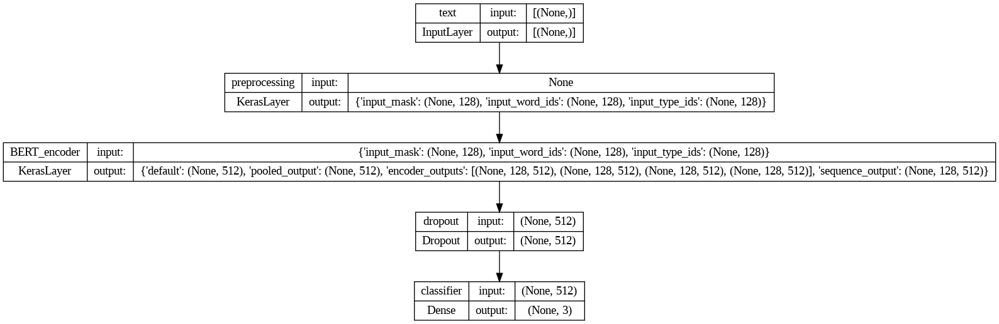

In [ ]:
baseline_mod = bert_model(tfhub_handle_preprocess, tfhub_handle_encoder).assemble_full_model()
tf.keras.utils.plot_model(baseline_mod, show_shapes=True)

In [ ]:
# Initialize the AdamW optimizer
epochs = 30
steps_per_epoch = 1000
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

baseline_mod.compile(optimizer=optimizer,
                         loss='categorical_crossentropy',
                         metrics=[tfa.metrics.F1Score(num_classes=3, threshold=0.5, average='macro')])

In [ ]:
name_m0 = 'models/baseline_model'
training=True
callbacks, train_model = verify_training(name_m0, training)

if train_model:
  print(f'Training model with {tfhub_handle_encoder}')
  history = baseline_mod.fit(x=training_generator,
                            validation_data=val_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.3046 - f1_score: 0.1794
Epoch 1: val_loss improved from inf to 1.24694, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/baseline_model/
63/63 [==============================] - 25s 194ms/step - loss: 1.3046 - f1_score: 0.1794 - val_loss: 1.2469 - val_f1_score: 0.1252
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.3024 - f1_score: 0.1848
Epoch 2: val_loss improved from 1.24694 to 1.24222, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/baseline_model/
63/63 [==============================] - 14s 226ms/step - loss: 1.3024 - f1_score: 0.1848 - val_loss: 1.2422 - val_f1_score: 0.1238
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.2994 - f1_score: 0.1959
Epoch 3: val_loss improved from 1.24222 to 1.23658, saving model to /content/drive/My Drive/RMIT/COSC277

## Model Analysis
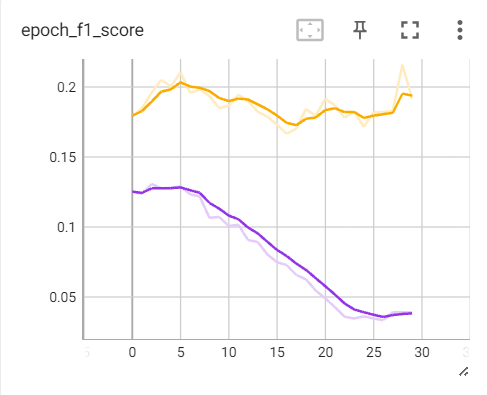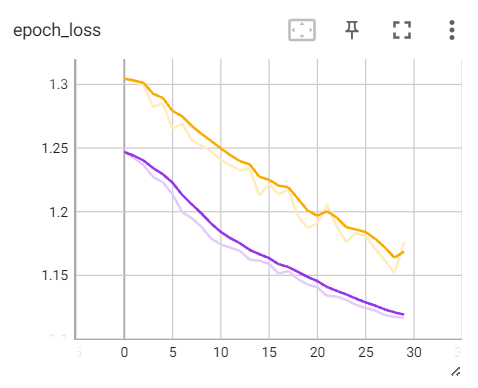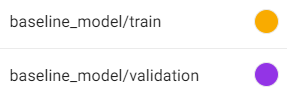

From above, it can be seen that the F1 Macro of the baseline model is not at all good, with a validation F1 Score of only 0.04. This could be reasoned by the fact that the complexity of the model is not high enough for the task, with only an output layer following the BERT encoding layer. Additionaly, there is overfitting observe, which could be caused by the oversampled data present. Thus, the model's complexity will be increased and regularization methods will be incorporated.

# Model 1 : BERT with more layers + Regularization
To increase the model complexity, an LSTM layer will be added to the model architecture. LSTM allows network to capture long range dependencies.  

To avoid overfitting, dropout will be added to the LSTM layer.

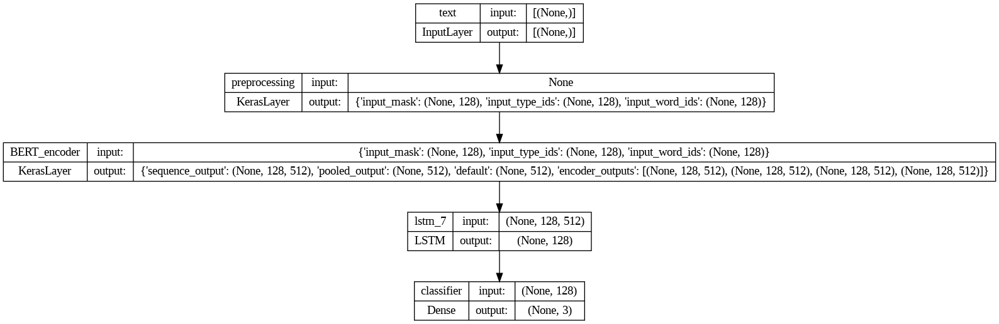

In [ ]:
class bert_ml_model(bert_model):
  def assemble_full_model(self):
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')

    x = self.preprocessing_layer(text_input)
    x = self.encoder(x)

    # Sequence output will be return instead of pooled output to feed into LSTM
    bert_outputs = x['sequence_output']

    net = tf.keras.layers.LSTM(128, return_sequences=False,
                                        dropout=0.3,
                                        recurrent_dropout=0.1)(bert_outputs)

    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(text_input, net)

model_1 = bert_ml_model(tfhub_handle_preprocess, tfhub_handle_encoder).assemble_full_model()
tf.keras.utils.plot_model(model_1, show_shapes=True)

In [ ]:
epochs = 30
steps_per_epoch = 1000
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')


model_1.compile(optimizer=optimizer,
                         loss='categorical_crossentropy',
                         metrics=[tfa.metrics.F1Score(num_classes=3, threshold=0.5, average='macro')])

In [ ]:
name_m1 = 'models/model_1'
training=True

callbacks, train_model = verify_training(name_m1, training)

if train_model:
  print(f'Training model with {tfhub_handle_encoder}')
  history = model_1.fit(x=training_generator,
                            validation_data=val_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1273 - f1_score: 0.0566
Epoch 1: val_loss improved from inf to 1.09462, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_1/
63/63 [==============================] - 67s 942ms/step - loss: 1.1273 - f1_score: 0.0566 - val_loss: 1.0946 - val_f1_score: 0.0206
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1245 - f1_score: 0.0581
Epoch 2: val_loss did not improve from 1.09462
63/63 [==============================] - 51s 814ms/step - loss: 1.1245 - f1_score: 0.0581 - val_loss: 1.0958 - val_f1_score: 0.0151
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.1225 - f1_score: 0.0451
Epoch 3: val_loss did not improve from 1.09462
63/63 [==============================] - 51s 813ms/step - loss: 1.1225 - f1_score: 0.0451 - val_loss: 1.0982 - val_f1_score: 0.0106
Epoch 4/30
63/63

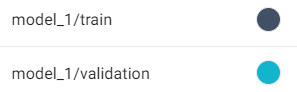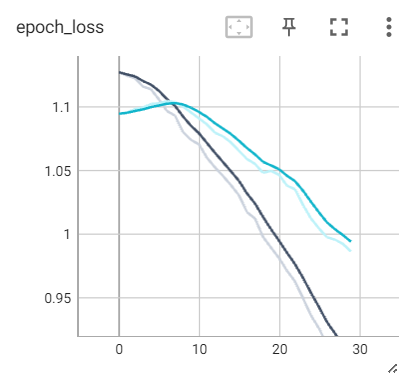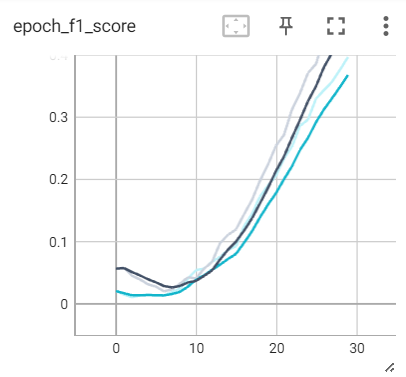

## Model Analysis

From above, it can be seen that the model's performance has improved and overfitting has improved significantly. However, the model only achieved roughtly 40% F1 Score, thus, the model complexity will be further increased to increase the performance.

# Model 2 : BERT with increased complexity
The number of units for the LSTM layer will be increased from 128 to 256 and the recurrent dropout will be increased to 0.2 to prevent overfitting.



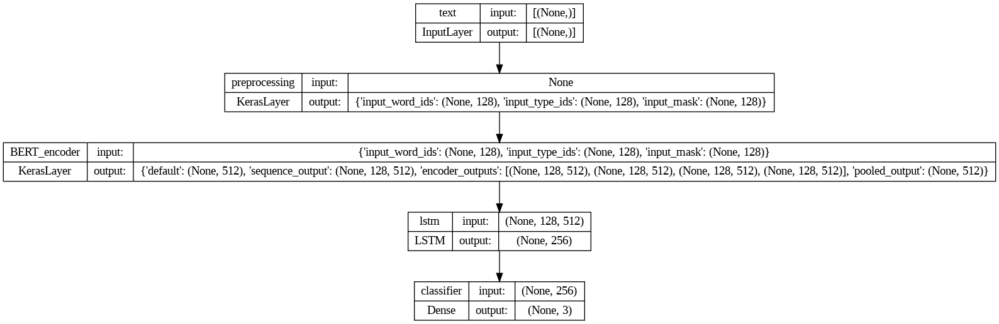

In [ ]:
class bert_ml_l1_model(bert_model):
  def assemble_full_model(self):
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')

    x = self.preprocessing_layer(text_input)
    x = self.encoder(x)

    bert_outputs = x['sequence_output']

    net = tf.keras.layers.LSTM(256, return_sequences=False,
                                        dropout=0.3,
                                        recurrent_dropout=0.2)(bert_outputs)

    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(text_input, net)

model_2 = bert_ml_l1_model(tfhub_handle_preprocess, tfhub_handle_encoder).assemble_full_model()
tf.keras.utils.plot_model(model_2, show_shapes=True)

In [ ]:
epochs = 30
steps_per_epoch = 1000
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_2.compile(optimizer=optimizer,
                loss='categorical_crossentropy',
                metrics=[tfa.metrics.F1Score(num_classes=3, threshold=0.5, average='macro')])

In [ ]:
name_m2 = 'models/model_2'
training=True

callbacks, train_model = verify_training(name_m2, training)

if train_model:
  print(f'Training model with {tfhub_handle_encoder}')
  history = model_2.fit(x=training_generator,
                            validation_data=val_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1528 - f1_score: 0.0588
Epoch 1: val_loss improved from inf to 1.22682, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_2/
63/63 [==============================] - 71s 1s/step - loss: 1.1528 - f1_score: 0.0588 - val_loss: 1.2268 - val_f1_score: 0.0462
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1470 - f1_score: 0.0511
Epoch 2: val_loss improved from 1.22682 to 1.20465, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_2/
63/63 [==============================] - 57s 905ms/step - loss: 1.1470 - f1_score: 0.0511 - val_loss: 1.2047 - val_f1_score: 0.0388
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.1336 - f1_score: 0.0348
Epoch 3: val_loss improved from 1.20465 to 1.17987, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_

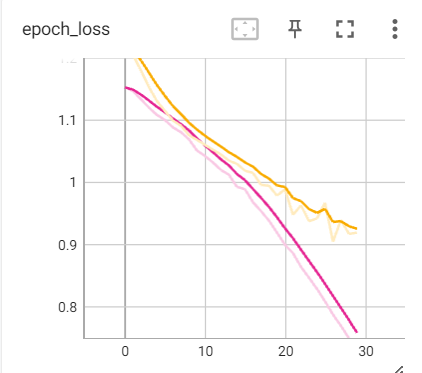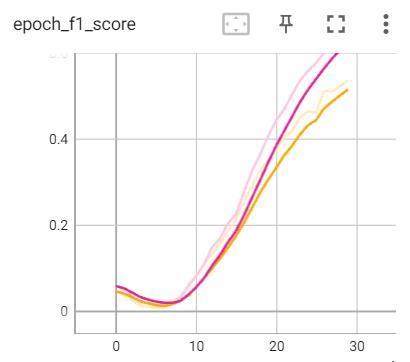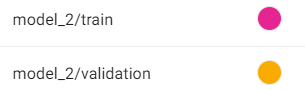

## Model Analysis
After increasing the number of units of the LSTM layer, it can be seen that the model's performance further improved. However, the model started overfitting near the end of training. With that, the model will be further regularized to eliminate the overfitting issue.



# Model 3 : More Regualrization
The dropout rate will be increased to overcome the overfitting.

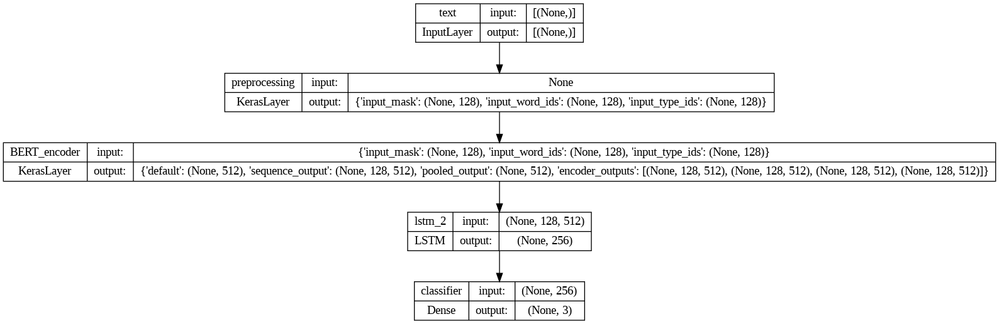

In [ ]:
class bert_ml_l1_model2(bert_model):
  def assemble_full_model(self):
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')

    x = self.preprocessing_layer(text_input)
    x = self.encoder(x)

    bert_outputs = x['sequence_output']

    net = tf.keras.layers.LSTM(256,
                               return_sequences=False,
                               dropout=0.5,
                               recurrent_dropout=0.3)(bert_outputs)

    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(text_input, net)

model_3 = bert_ml_l1_model2(tfhub_handle_preprocess, tfhub_handle_encoder).assemble_full_model()
tf.keras.utils.plot_model(model_3, show_shapes=True)

In [ ]:
epochs = 30
steps_per_epoch = 1000
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_3.compile(optimizer=optimizer,
                loss='categorical_crossentropy',
                metrics=[tfa.metrics.F1Score(num_classes=3, threshold=0.5, average='macro')])

In [ ]:
name_m3 = 'models/model_3'
training=True

callbacks, train_model = verify_training(name_m3, training)

if train_model:
  print(f'Training model with {tfhub_handle_encoder}')
  history = model_3.fit(x=training_generator,
                            validation_data=val_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1403 - f1_score: 0.1073
Epoch 1: val_loss improved from inf to 1.05241, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_3/
63/63 [==============================] - 81s 1s/step - loss: 1.1403 - f1_score: 0.1073 - val_loss: 1.0524 - val_f1_score: 0.1195
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1368 - f1_score: 0.0979
Epoch 2: val_loss did not improve from 1.05241
63/63 [==============================] - 53s 850ms/step - loss: 1.1368 - f1_score: 0.0979 - val_loss: 1.0530 - val_f1_score: 0.1027
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.1315 - f1_score: 0.0797
Epoch 3: val_loss did not improve from 1.05241
63/63 [==============================] - 54s 867ms/step - loss: 1.1315 - f1_score: 0.0797 - val_loss: 1.0583 - val_f1_score: 0.0786
Epoch 4/30
63/63 [=

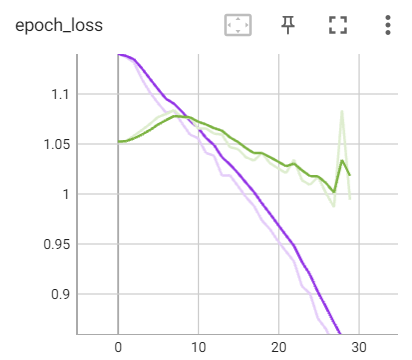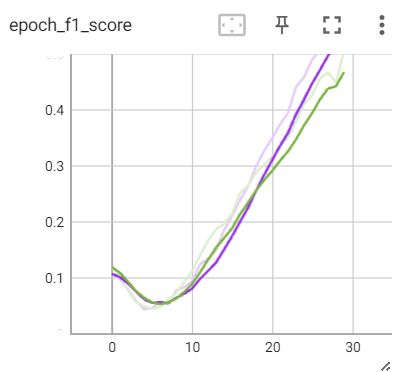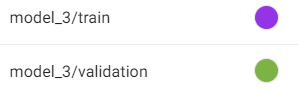

## Model Analysis


From above, it can be seen that the training performance was slightly worse than the previous model and the validation loss starts to spike at the end of trainig.

# Model 4 : Data Augmentation
According to Chopard, Treder and Spasie (2021), data agumentation is less popular when it comes to NLP due it its complexity and limited resutls.


However, there are existing techniques to perform data augmentation on textual data. According to ES (2023), a few data augmentation methods include  
- Back Translation
- EDA (Easy Data Augmentation)
- NLP Albumentation
- NLPAug


Data augmentation is a good way to increase variety in the dataset while reducing overfitting. After some reading, the NLPAug Library will be used as it is a python package that allows data agumentation to be done
easily.  

According to the NLPAug documentation, there are augmenter for different levels ranging from characters, words to sentences. Different types of word augmenter include Contextual Word Embeddings, Synonym augmenter, Random Word Swapping and Back Translation.  

Due to the limited amout of computing resources, only the Synonym augmenter will be used for now to see if augmentation improves the model's performance.  

Model 2 will be used as it was performing better and Early Stopping will be added to stop the model training if the validation f1 score is not increasing for 10 epochs.



## Installation + Library Setup

In [ ]:
!pip install nlpaug -q --exists-action i

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.5/410.5 kB 3.6 MB/s eta 0:00:00


In [ ]:
import nlpaug
import nlpaug.augmenter.word as naw

aug = naw.SynonymAug(aug_src='wordnet',aug_max=2)

# Let's test this with a random sentence
sent = """This is the COSC2779 Assignment 2, Stance Classification task.
I hope I excel at this, just doin my thang :cry_face: #RMIT
"""
aug.augment(sent,n=3)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


['This is the COSC2779 Assignment 2, Stance Classification task. I hope Iodin excel at this, just doin my thang: cry_face: # RMIT',
 'This is the COSC2779 Assignment 2, Position Classification task. I hope I excel at this, just doin my thang: cry_face: # RMIT',
 'This is the COSC2779 Assignment ii, Stance Classification task. I hope I excel at this, just doin my thang: cry_face: # RMIT']

From above, it can be seen that the augmentation was not the best, however, the overall meaning of the sentece is arguably preserved. Thus, the augmenter will be used for training.

In [ ]:
def augment_data(text):
  aug = naw.SynonymAug(aug_src='wordnet',aug_min=0,aug_max=2)
  augmented_text = aug.augment(text,n=1)
  return augmented_text[0]


print(augment_data('This is a test, I am trying my best to work on this assignment'))

This is a test, I am trying my best to crop on this assignment


In [ ]:
training_generator_aug = DataGenerator(train, batch_size=BATCH_SIZE, augment=augment_data)
# val_generator = DataGenerator(val, batch_size=BATCH_SIZE)

In [ ]:
training_generator_aug.show()

Text:  b"I know why he has to do information technology. Given the audience and the case. But the God talk in President Obama ' s speech jars with me. A lot. # SemST Atheism"
Label:  1
Text:  b"@ HillaryforNV @ MissLynnetteH 2 hours left, let ' s chip in $ 5, Nevada! # raisethenewPOTUS # SemST Hillary Clinton"
Label:  2
Text:  b"People aren ' t ' pro - life ' they ' re ' pro - birth '. When a mother can ' t bring home the bacon what happens then? # SemST Legalization of Abortion"
Label:  1
Text:  b'lifeboatcoffee Thanks for the follow! Done with SB and other companies on the left. All about # 1M1W # CCOT # SemST Legalization of Abortion'
Label:  0
Text:  b"To judge if something is humane, ask yourself how you ' d feel if it were happening to you. # beagoodfuckingperson # SemST Atheism"
Label:  0
Text:  b"@ MrMikeCalta Proud to say I don ' t listen to fat crossed eyeball MJ # SemST Feminist Movement"
Label:  0
Text:  b'Last meeting of the year tonight! septenary: 00 pm in Case Hall room

## Training

In [ ]:
# A new model with the Model 2's architure will be initialized
model_4 = bert_ml_l1_model(tfhub_handle_preprocess,
                           tfhub_handle_encoder).assemble_full_model()

In [ ]:
epochs = 30
steps_per_epoch = 1000
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_4.compile(optimizer=optimizer,
                loss='categorical_crossentropy',
                metrics=[tfa.metrics.F1Score(num_classes=3, threshold=0.5, average='macro')])

In [ ]:
name_m4 = 'models/model_4'
training=True

callbacks, train_model = verify_training(name_m4, training,
                                         early_stopping=True,
                                         metric='val_f1_score',
                                         patience_num=10)

if train_model:
  print(f'Training model with {tfhub_handle_encoder}')
  history = model_4.fit(x=training_generator_aug,
                            validation_data=val_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1214 - f1_score: 0.0215
Epoch 1: val_loss improved from inf to 1.10874, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_4/
63/63 [==============================] - 94s 1s/step - loss: 1.1214 - f1_score: 0.0215 - val_loss: 1.1087 - val_f1_score: 0.0182
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1192 - f1_score: 0.0242
Epoch 2: val_loss improved from 1.10874 to 1.10405, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_4/
63/63 [==============================] - 69s 1s/step - loss: 1.1192 - f1_score: 0.0242 - val_loss: 1.1040 - val_f1_score: 0.0130
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.1171 - f1_score: 0.0182
Epoch 3: val_loss improved from 1.10405 to 1.10330, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_4/


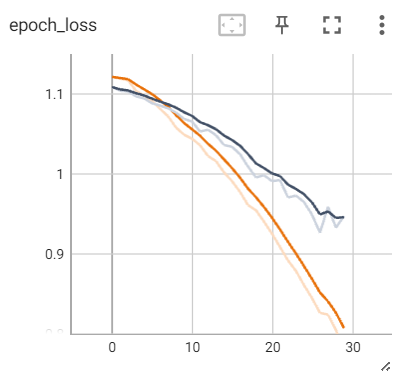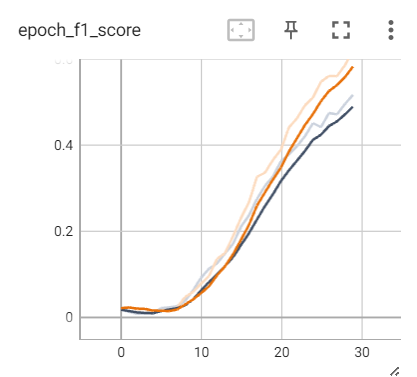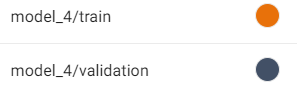

## Model Analysis

From above, it can be seen that the validation performance was not as high as Model 2 and the overfitting issue is not resolved. The augmentation will be kept and the model wil be further regularized to resolve overfitting.

# Model 5 : Increased regularization
The dropout and recurrent dropout rate is further increased.

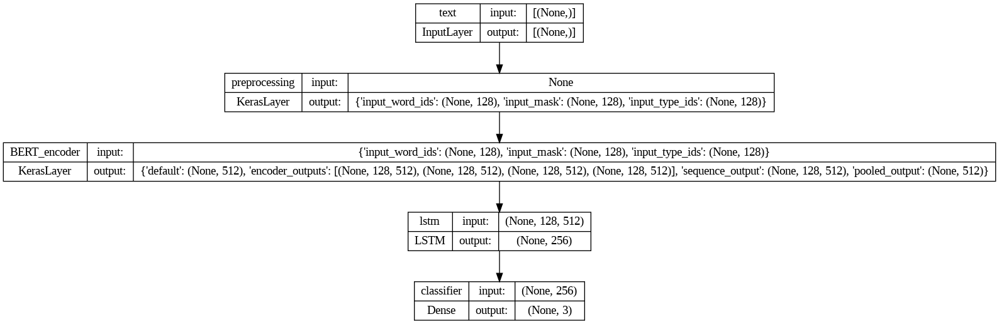

In [ ]:
class bert_ml_l1_model3(bert_model):
  def assemble_full_model(self):
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')

    x = self.preprocessing_layer(text_input)
    x = self.encoder(x)

    bert_outputs = x['sequence_output']

    net = tf.keras.layers.LSTM(256,
                               return_sequences=False,
                               dropout=0.6,
                               recurrent_dropout=0.3)(bert_outputs)

    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(text_input, net)

model_5 = bert_ml_l1_model3(tfhub_handle_preprocess, tfhub_handle_encoder).assemble_full_model()
tf.keras.utils.plot_model(model_5, show_shapes=True)

In [ ]:
epochs = 30
steps_per_epoch = 1000
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_5.compile(optimizer=optimizer,
                loss='categorical_crossentropy',
                metrics=[tfa.metrics.F1Score(num_classes=3, threshold=0.5, average='macro')])

In [ ]:
name_m5 = 'models/model_5'
training=True

callbacks, train_model = verify_training(name_m5, training, early_stopping=True)

if train_model:
  print(f'Training model with {tfhub_handle_encoder}')
  history = model_5.fit(x=training_generator_aug,
                            validation_data=val_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1476 - f1_score: 0.0820
Epoch 1: val_loss improved from inf to 1.09210, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_5/
63/63 [==============================] - 80s 1s/step - loss: 1.1476 - f1_score: 0.0820 - val_loss: 1.0921 - val_f1_score: 0.0734
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1339 - f1_score: 0.0712
Epoch 2: val_loss did not improve from 1.09210
63/63 [==============================] - 57s 903ms/step - loss: 1.1339 - f1_score: 0.0712 - val_loss: 1.0944 - val_f1_score: 0.0603
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.1314 - f1_score: 0.0493
Epoch 3: val_loss did not improve from 1.09210
63/63 [==============================] - 56s 897ms/step - loss: 1.1314 - f1_score: 0.0493 - val_loss: 1.0985 - val_f1_score: 0.0435
Epoch 4/30
63/63 [=

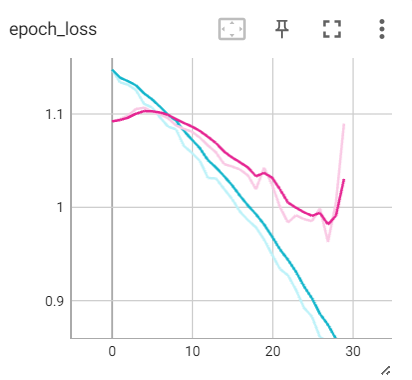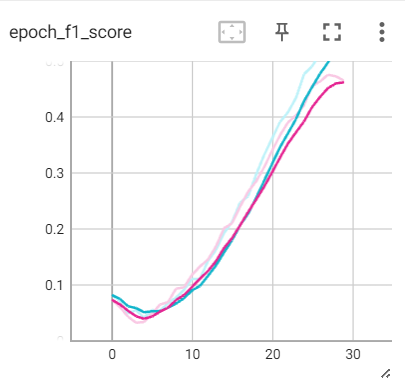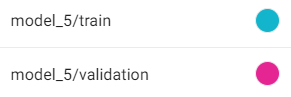

## Model Analysis

Similar to Model 3, the model had worse performance and validation loss did not improve until after epoch 9. Additionally, the validation loss was unstable throughout the training and spiked at the end of the epochs.

# Model 6 : BERTweet + LSTM

Nguyen and Nguyen (2020) developed the model BERTweet that is trained based on RoBERTa for English Tweets and has shown high performance on different tasks. Thus, the model will be used to see if it could improve the performance for this task.

## Installation & Importing

In [ ]:
!pip install transformers --exists-action i --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 60.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 80.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 25.0 MB/s eta 0:00:00


In [ ]:
!pip install tokenizers --exists-action i --quiet

In [ ]:
!pip install nltk emoji==0.6.0 --exists-action i --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 354.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from transformers import TFAutoModel, AutoTokenizer
bertweet = TFAutoModel.from_pretrained("vinai/bertweet-base")

bertweet_tokenizer = AutoTokenizer.from_pretrained('vinai/bertweet-base',
                                          normalization=True,
                                          use_fast = False,
                                          add_special_tokens=True,
                                          pad_to_max_length=True,
                                          return_attention_mask=True)

Some layers from the model checkpoint at vinai/bertweet-base were not used when initializing TFRobertaModel: ['lm_head']
- This IS expected if you are initializing TFRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFRobertaModel were initialized from the model checkpoint at vinai/bertweet-base.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


Other than the pretrained module, they also provided a TweetNormalizer module that tokenizes the Tweets before passing it to the encoder. The module provided will be utilized.

In [ ]:
# @inproceedings{bertweet,
# title     = {{BERTweet: A pre-trained language model for English Tweets}},
# author    = {Dat Quoc Nguyen and Thanh Vu and Anh Tuan Nguyen},
# booktitle = {Proceedings of the 2020 Conference on Empirical Methods in Natural Language Processing: System Demonstrations},
# pages     = {9--14},
# year      = {2020}
# }


from emoji import demojize
from nltk.tokenize import TweetTokenizer


tokenizer = TweetTokenizer()


def normalizeToken(token):
    lowercased_token = token.lower()
    if token.startswith("@"):
        return "@USER"
    elif lowercased_token.startswith("http") or lowercased_token.startswith("www"):
        return "HTTPURL"
    elif len(token) == 1:
        return demojize(token)
    else:
        if token == "’":
            return "'"
        elif token == "…":
            return "..."
        else:
            return token


def normalizeTweet(tweet):
    tokens = tokenizer.tokenize(tweet.replace("’", "'").replace("…", "..."))
    normTweet = " ".join([normalizeToken(token) for token in tokens])

    normTweet = (
        normTweet.replace("cannot ", "can not ")
        .replace("n't ", " n't ")
        .replace("n 't ", " n't ")
        .replace("ca n't", "can't")
        .replace("ai n't", "ain't")
    )
    normTweet = (
        normTweet.replace("'m ", " 'm ")
        .replace("'re ", " 're ")
        .replace("'s ", " 's ")
        .replace("'ll ", " 'll ")
        .replace("'d ", " 'd ")
        .replace("'ve ", " 've ")
    )
    normTweet = (
        normTweet.replace(" p . m .", "  p.m.")
        .replace(" p . m ", " p.m ")
        .replace(" a . m .", " a.m.")
        .replace(" a . m ", " a.m ")
    )

    return " ".join(normTweet.split())

With the TweetNormalizer module imported, the data generator will need to be updated to use this function to process the tweets, this includes the validation set.

In [ ]:
# Example of BERTweet's tokenizer
text_test = ['This is such an amazing movie!']
text_preprocessed = bertweet_tokenizer(text_test,
                                       padding = 'max_length',
                                       truncation=True,
                                       return_tensors='tf')

print("BERTweet Tokenizer")
# print(text_preprocessed)
print(f'Keys       : {list(text_preprocessed.keys())}')
print(f'Shape      : {np.shape(text_preprocessed["input_ids"])}')
print(f'Word Ids   : {text_preprocessed["input_ids"][:12]}')
print(f'Input Mask : {text_preprocessed["attention_mask"][:12]}')
print(f'Type Ids   : {text_preprocessed["token_type_ids"][:12]}')

BERTweet Tokenizer
Keys       : ['input_ids', 'token_type_ids', 'attention_mask']
Shape      : (1, 128)
Word Ids   : [[  0 126  17 367  74 416 566  12   2   1   1   1   1   1   1   1   1   1
    1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
    1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
    1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
    1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
    1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
    1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
    1   1]]
Input Mask : [[1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
Type Ids   : [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [ ]:
bertweet(text_preprocessed).last_hidden_state

<tf.Tensor: shape=(1, 128, 768), dtype=float32, numpy=
array([[[-0.03525068,  0.3007022 ,  0.2661028 , ..., -0.03542872,
         -0.03372434,  0.01915737],
        [-0.00775126,  0.3471499 ,  0.5445355 , ...,  0.33763763,
         -0.02165864, -0.27143174],
        [ 0.24015531,  0.05178519,  0.4467068 , ...,  0.3157758 ,
         -0.39151815,  0.10830598],
        ...,
        [-0.03525049,  0.30070227,  0.26610285, ..., -0.03542855,
         -0.03372425,  0.01915712],
        [-0.03525049,  0.30070227,  0.26610285, ..., -0.03542855,
         -0.03372425,  0.01915712],
        [-0.03525049,  0.30070227,  0.26610285, ..., -0.03542855,
         -0.03372425,  0.01915712]]], dtype=float32)>

## BERTweet Data Generator

As the BERTweet was not provided by Tensorflow Hub, the data generator would have to be modified to provide data that fits the model. The new data generator would normalize and tokenize the tweets and feeds the model the tokenized text instead of the tweets in strings.

In [ ]:
import random
import tensorflow.keras as keras

class BTDataGenerator(keras.utils.Sequence):
  'Data Generator initialization'
  def __init__(self, dataframe, batch_size=8,dim=(128,),
               n_classes=3, shuffle=True, augment = augment_data,
               normalize = normalizeTweet, tokenizer = bertweet_tokenizer):

    self.dim = dim
    self.batch_size = batch_size
    self.n_classes = n_classes

    self.shuffle = shuffle
    self.augment = augment

    self.dataframe = dataframe

    self.labels = dataframe['Stance'].values.tolist()

    # Assign a number incrementally to every data in the dataset
    self.text_ids = np.arange(len(self.labels)).tolist()

    self.normalize = normalize
    self.tokenizer = tokenizer

    self.on_epoch_end()

  def __len__(self):
    return int(np.floor(len(self.text_ids) / self.batch_size))

  def show_individual(self):
    ind = random.choice(self.text_ids)
    label = self.labels[ind]
    return

  def show(self, num=10):
    for i in range(num):
        ind = random.choice(self.text_ids)
        label = self.labels[ind]
        text = self.read_data(self.text_ids[ind])
        print("Text: ",text)
        print("Label: ",label)

    return

  def __getitem__(self, index):
    # Get all indexes of text for this batch
    indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

    # get the nth text from the batched indexes
    data_ids_temp = [self.text_ids[k] for k in indexes]

    # get the nth labels from the batched indexes
    label_temp = [self.labels[k] for k in indexes]

    X, y = self.__data_generation(data_ids_temp,
                                  label_temp)

    # {'input_ids':input_ids, 'token_type_ids':token_type_ids, 'attention_mask':attention_mask}
    return X, y

  def on_epoch_end(self):
    self.indexes = np.arange(len(self.text_ids))
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, data_ids_temp, label_temp):
    # Initialize empty arrays for the tokenized tweets
    input_ids = np.empty((self.batch_size, *self.dim),dtype=int)
    token_type_ids = np.empty((self.batch_size, *self.dim),dtype=int)
    attention_mask = np.empty((self.batch_size, *self.dim),dtype=int)

    y = np.empty((self.batch_size),dtype=int)

    # Populate all data into the empty arrays
    for i,ids in enumerate(data_ids_temp):
      data = self.__read_data_instance(data_ids_temp[i])

      input_ids[i,] = data['input_ids'].numpy()
      token_type_ids[i,] = data['token_type_ids'].numpy()
      attention_mask[i,] = data['attention_mask'].numpy()

      y[i] = label_temp[i]

    return [input_ids, token_type_ids, attention_mask], keras.utils.to_categorical(y, num_classes=self.n_classes)

  def __read_data_instance(self, pid):
    # Gets the Tweet and Target
    target = self.dataframe.iloc[pid]['Target']
    tweet = self.dataframe.iloc[pid]['Tweet']

    # Augment the tweet if the augment function is provided
    if self.augment is not None:
      tweet = self.augment(tweet)

    # Normalize the tweet using the provided TweetNormalizer module
    target = self.normalize(target)
    tweet = self.normalize(tweet)

    # Tokenize the tweet and target
    tokens = self.tokenizer(tweet,
                       target,
                       padding="max_length",
                       truncation=True,
                       return_tensors = 'tf',
                       return_token_type_ids=True).data

    return tokens

  def read_data(self,pid):
    target = self.dataframe.iloc[pid]['Target']
    tweet = self.dataframe.iloc[pid]['Tweet']

    if self.augment is not None:
      tweet = self.augment(tweet)

    target = self.normalize(target)
    tweet = self.normalize(tweet)

    return tweet+' '+ target
# Source: COSC2779 Week 5 Lab Exercse

In [ ]:
btrain_generator = BTDataGenerator(train, batch_size=BATCH_SIZE)
# Do not augment data for validation set
bval_generator = BTDataGenerator(val, batch_size=BATCH_SIZE, augment=None)

In [ ]:
btrain_generator.show(5)

Text:  # SoProLife they want to force Texans to carry pregnancies that WON ' T EVEN PRODUCE animation . # SemST Legalization of Abortion
Label:  1
Text:  Phratry , this is what happens when Liberals are in control ! All hell breaks loose ! Had adequate yet ? # SemST Hillary Clinton
Label:  2
Text:  GlblWarmingNews And the tooth fairy might be causing youngster to lose teeth ! # carbontaxscam # Chemtrails # SemST Climate Change is a Real Concern
Label:  2
Text:  Therefore quick for my abortion debate # SemST Legalization of Abortion
Label:  0
Text:  I refuse to let people like you shame and insult women for get at healthcare . Sorry . Just no . Legalization of Abortion
Label:  1


## BERTweet Model
A bertweet model architecture takes 3 inputs and the 3 inputs will be passed to the BERTweet encoder before passing to the LSTM layer with Dropout to prevent overfitting.

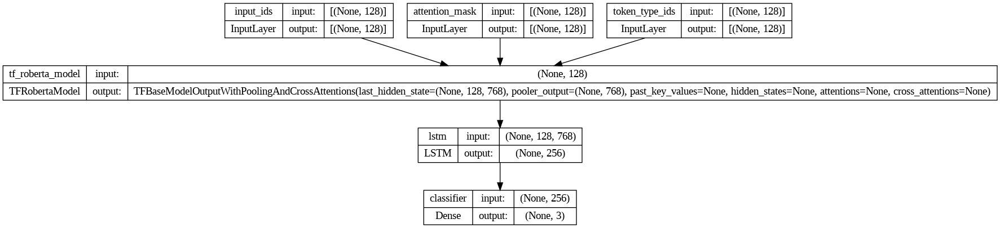

In [ ]:
class bertweet_model(bert_model):
  def encoder(self, inputs):
    encoder = self.tfhub_handle_encoder
    # Encoder with take in 3 inputs to generate embeddings
    output = encoder(input_ids=inputs[0],token_type_ids=inputs[1], attention_mask=inputs[2])
    return output

  def assemble_full_model(self):
    input_ids = tf.keras.Input(shape=(128,), dtype='int32',name='input_ids')
    token_type_ids = tf.keras.Input(shape=(128,), dtype='int32',name='token_type_ids')
    attention_masks = tf.keras.Input(shape=(128,), dtype='int32',name='attention_mask')
    inputs = [input_ids,token_type_ids, attention_masks]

    x = self.encoder(inputs)

    bert_outputs = x.last_hidden_state

    net = tf.keras.layers.LSTM(256,
                               dropout=0.5,
                               recurrent_dropout=0.3)(bert_outputs)

    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(inputs, net)


model_6 = bertweet_model(bertweet_tokenizer, bertweet).assemble_full_model()
tf.keras.utils.plot_model(model_6, show_shapes=True)

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_6.compile(optimizer=optimizer,
                loss="categorical_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])

In [ ]:
name_m6 = 'models/model_6'
training=True

callbacks, train_model = verify_training(name_m6, training,
                                         early_stopping=True,
                                         metric='val_f1_score',
                                         patience_num=10)


if train_model:
  print(f'Training model with BERTweet')
  history = model_6.fit(x=btrain_generator,
                        validation_data=bval_generator,
                        callbacks=callbacks,
                        epochs=epochs)

Training model with BERTweet
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1103 - f1_score: 0.0000e+00
Epoch 1: val_loss improved from inf to 1.07960, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_6/
63/63 [==============================] - 214s 3s/step - loss: 1.1103 - f1_score: 0.0000e+00 - val_loss: 1.0796 - val_f1_score: 0.0000e+00
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1043 - f1_score: 0.0000e+00
Epoch 2: val_loss did not improve from 1.07960
63/63 [==============================] - 115s 2s/step - loss: 1.1043 - f1_score: 0.0000e+00 - val_loss: 1.0868 - val_f1_score: 0.0000e+00
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.0955 - f1_score: 0.0000e+00
Epoch 3: val_loss improved from 1.07960 to 1.06780, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_6/
63/63 [==============================] - 235s 4s/step - loss: 1.0955 - f1_score: 0.0000e+00 - val_loss: 1.0678

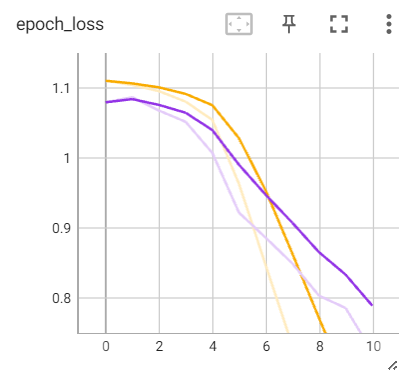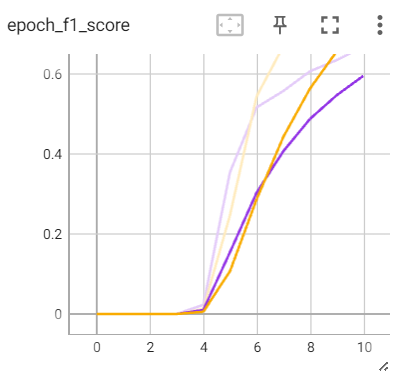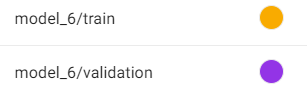

## Model Analysis

The model was halted early, with a validation f1 score of 67% and training f1 score of 82%. From the learning curves, it can be seen that the model is still overfitting.  

Since the BERT model is not changed into BERTweet, the model complexity could be decreased to see if this could reduce the overfitting issue while keeping up with the performance. It is also shown that the model performance stayed stagnant for the first few epochs, thus, the learning rate will be increased to help with the training.

# Model 7 : Decreased Model Complexity, Increased Learning Rate
The learning rate will be increased to 5e-5 to speed up loss convergence and the LSTM units will be decreased to just 64 units to improve overfitting.

In [ ]:
init_lr = 5e-5

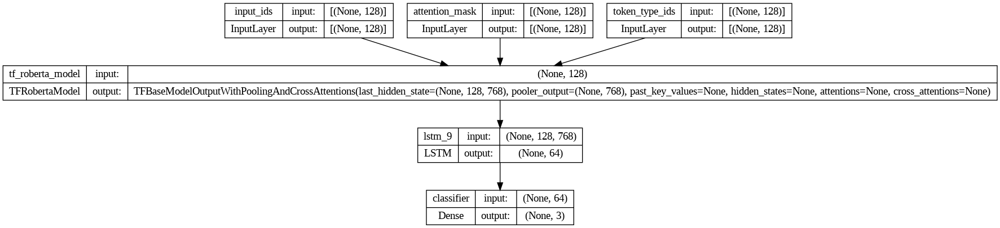

In [ ]:
class bertweet_model2(bertweet_model):

  def assemble_full_model(self):
    input_ids = tf.keras.Input(shape=(128,), dtype='int32',name='input_ids')
    token_type_ids = tf.keras.Input(shape=(128,), dtype='int32',name='token_type_ids')
    attention_masks = tf.keras.Input(shape=(128,), dtype='int32',name='attention_mask')
    inputs = [input_ids,token_type_ids, attention_masks]

    x = self.encoder(inputs)

    bert_outputs = x.last_hidden_state

    net = tf.keras.layers.LSTM(64,
                              dropout=0.5,
                              recurrent_dropout=0.3)(bert_outputs)

    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(inputs, net)


model_7 = bertweet_model2(bertweet_tokenizer, bertweet).assemble_full_model()
tf.keras.utils.plot_model(model_7, show_shapes=True)

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_7.compile(optimizer=optimizer,
                loss="categorical_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])

In [ ]:
name_m7 = 'models/model_7'
training=True

callbacks, train_model = verify_training(name_m7, training,
                                         early_stopping=True,
                                         metric='val_f1_score',
                                         patience_num=10)

if train_model:
  print(f'Training model with BERTweet')
  history = model_7.fit(x=btrain_generator,
                        validation_data=bval_generator,
                        callbacks=callbacks,
                        epochs=epochs)

Training model with BERTweet
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1536 - f1_score: 0.0807
Epoch 1: val_loss improved from inf to 1.01843, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_7/
63/63 [==============================] - 303s 4s/step - loss: 1.1536 - f1_score: 0.0807 - val_loss: 1.0184 - val_f1_score: 0.1311
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 0.7999 - f1_score: 0.5427
Epoch 2: val_loss improved from 1.01843 to 0.84409, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_7/
63/63 [==============================] - 661s 11s/step - loss: 0.7999 - f1_score: 0.5427 - val_loss: 0.8441 - val_f1_score: 0.5515
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 0.5063 - f1_score: 0.8703
Epoch 3: val_loss improved from 0.84409 to 0.81392, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_7/
63/63 [==============================] - 404s 6s/step - loss

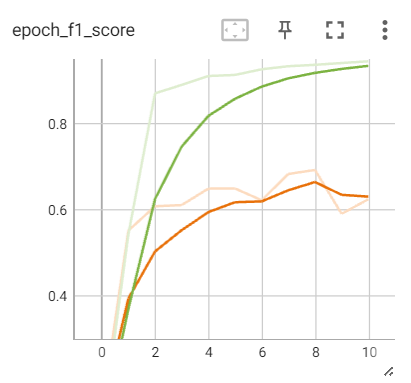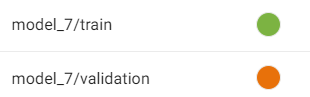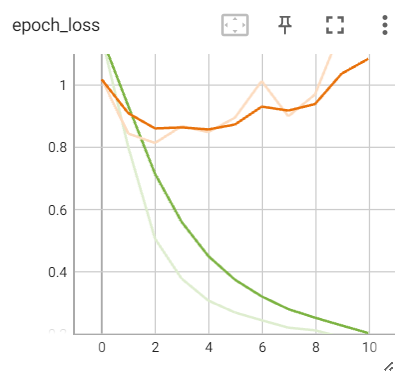

## Model Analysis

From above, it can be seen that the model performance improved extremely quickly and the validation performance was unstable, thus, the learning rate will be decreased again. The training performance improved but the validation performance did not. Additionally, the model overfitted very early on and got worse compared to previous models.

According to the researchers from BERTweet, for every task and dataset, they fine-tuned BERTweet using AdamW with a fixed learning rate of 1.e-5 and a batch size of 32 and stop training after no improvement is observed for 5 continuous epochs. Thus, the learning rate will be reduced to that.

# Model 8 : BERTweet Model only, Decreased Learning Rate
To stabilize the validation performance and eliminate overfitting, the LSTM layer will be removed, leaving just the BERTweet model.


In [ ]:
init_lr = 1e-5

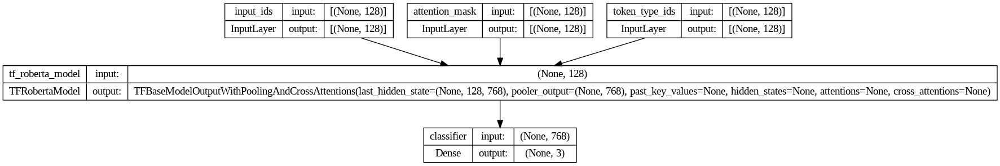

In [ ]:
class bertweet_model3(bertweet_model):

  def assemble_full_model(self):
    input_ids = tf.keras.Input(shape=(128,), dtype='int32',name='input_ids')
    token_type_ids = tf.keras.Input(shape=(128,), dtype='int32',name='token_type_ids')
    attention_masks = tf.keras.Input(shape=(128,), dtype='int32',name='attention_mask')
    inputs = [input_ids,token_type_ids, attention_masks]

    x = self.encoder(inputs)

    bert_outputs = x.pooler_output

    # net = tf.keras.layers.Dropout(0.3)(bert_outputs)
    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(bert_outputs)
    return tf.keras.Model(inputs, net)


model_8 = bertweet_model3(bertweet_tokenizer, bertweet).assemble_full_model()
tf.keras.utils.plot_model(model_8, show_shapes=True)

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_8.compile(optimizer=optimizer,
                loss="categorical_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])

In [ ]:
name_m8 = 'models/model_8'
training=True

callbacks, train_model = verify_training(name_m8, training,
                                         early_stopping=True,
                                         metric='val_f1_score',
                                         patience_num=10)


if train_model:
  print(f'Training model with BERTweet')
  history = model_8.fit(x=btrain_generator,
                            validation_data=bval_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Training model with BERTweet
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.1155 - f1_score: 0.0000e+00
Epoch 1: val_loss improved from inf to 1.10806, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_8/
63/63 [==============================] - 198s 2s/step - loss: 1.1155 - f1_score: 0.0000e+00 - val_loss: 1.1081 - val_f1_score: 0.0000e+00
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.1039 - f1_score: 0.0000e+00
Epoch 2: val_loss improved from 1.10806 to 1.10244, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_8/
63/63 [==============================] - 142s 2s/step - loss: 1.1039 - f1_score: 0.0000e+00 - val_loss: 1.1024 - val_f1_score: 0.0000e+00
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 1.0967 - f1_score: 0.0000e+00
Epoch 3: val_loss improved from 1.10244 to 1.09088, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_8/
63/63 [==========================

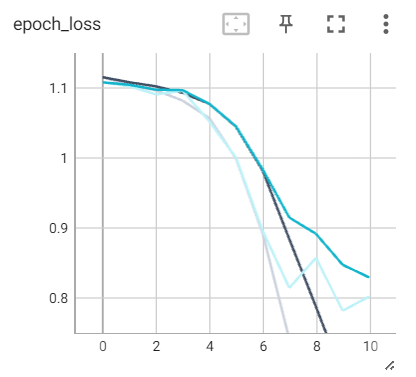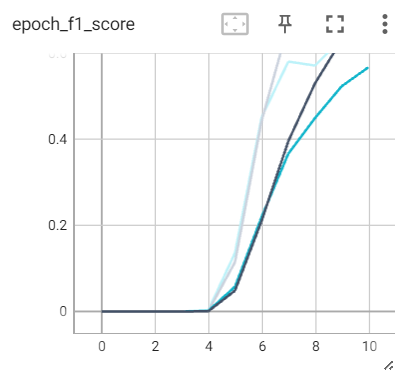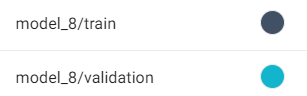

## Model Analysis
After the LSTM layer is removed, the degree of overfitting is reduced. However, overfitting is still present and validation loss is still slightly unstable.

# Model 9 : Improved augmentation
It is hypothesized that the model keeps overfitting due to the sampling strategy, creating a lot of duplicated training data.

PEGASUS is a standard Transformer encoder-decoder that uses GSG to pre-train the encoder-decoder on a large corpora of documents. (Ma 2019) It is able to paraphrase one sentence into multiple different sentences with the same meaning. Thus, PEGASUS will be tried out to augment those with multiple duplicated data to increase the variability of the dataset.


@misc{ma2019nlpaug,  
    title={NLP Augmentation},  
    author={Edward Ma},  
    howpublished={https://github.com/makcedward/nlpaug},  
    year={2019}  
  }

## Pegasus paraphrase

In [ ]:
from transformers import PegasusForConditionalGeneration, PegasusTokenizer

In [ ]:
BEAM_NUM = 10
RETURN_SEQ_NUM = 10
PEGASUS_PRETRAINED_MODEL = 'tuner007/pegasus_paraphrase'

In [ ]:
pegasus_tokenizer = PegasusTokenizer.from_pretrained(PEGASUS_PRETRAINED_MODEL)
pegasus_model = PegasusForConditionalGeneration.from_pretrained(PEGASUS_PRETRAINED_MODEL)

Some weights of PegasusForConditionalGeneration were not initialized from the model checkpoint at tuner007/pegasus_paraphrase and are newly initialized: ['model.encoder.embed_positions.weight', 'model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
input_text = "Global Warming News And the tooth fairy might be causing kids to lose teeth! #Earth @UN"

batch = pegasus_tokenizer([input_text], truncation=True, padding='longest', max_length=60, return_tensors="pt")
translated = pegasus_model.generate(**batch, max_length=60, num_beams=BEAM_NUM, num_return_sequences=RETURN_SEQ_NUM, temperature=1.5)
tgt_text = pegasus_tokenizer.batch_decode(translated, skip_special_tokens=True)

print("ACTUAL TEXT: ",input_text)
for each_text in tgt_text:
    print(each_text)

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:362: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `1.5` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(


ACTUAL TEXT:  Global Warming News And the tooth fairy might be causing kids to lose teeth! #Earth @UN
The tooth fairy might be causing kids to lose teeth.
The tooth fairy may be causing kids to lose teeth.
The tooth fairy could be causing kids to lose teeth.
The tooth fairy may be causing children to lose teeth.
The tooth fairy might be causing children to lose teeth.
Kids might lose teeth because of the tooth fairy.
Kids might be losing teeth because of the tooth fairy.
The tooth fairy could be causing children to lose teeth.
The tooth fairy is causing kids to lose teeth.
The tooth fairy might be making kids lose teeth.


From above, it can be seen that the pegasus model does not preserve the hashtag information. Thus, the hashtags will first be extracted, after augmentation, the hashtag and mentions will be appended at the end of the sentence for those that are augmented.

In [ ]:
# Function to remove hashtags and mentions
def strip_hashtag_mention(row):
  nakedtweet = row['Tweet']
  for hashtag in row['hashtags']:
    nakedtweet = nakedtweet.replace(hashtag,'')

  for mention in row['mentions']:
    nakedtweet = nakedtweet.replace(mention,'')
  return nakedtweet

In [ ]:
train['NakedTweet'] = train.apply(lambda x: strip_hashtag_mention(x), axis=1)

In [ ]:
# Get tweets that are duplicated
train['duplicated'] = train.duplicated(subset=['NakedTweet'])
train[train['duplicated']==True]

,Tweet,Target,Stance,Opinion Towards,Sentiment,word_count,words,hashtags,mentions,symbols,topic_stance,NakedTweet,duplicated
244,@StateDept @AmbCathyRussell @AdamSmith_USA @Hi...,Hillary Clinton,1,1. The tweet explicitly expresses opinion abo...,pos,13,"[statedept, ambcathyrussell, adamsmith_usa, hi...","[#world, #SemST]","[@StateDept, @AmbCathyRussell, @AdamSmith_USA,...",[],"Hillary Clinton, FAVOR",The whole is supporting you.,True
620,@readyforHRC Support encourage #HillaryClint...,Hillary Clinton,1,1. The tweet explicitly expresses opinion abo...,pos,14,"[readyforhrc, support, encourage, hillaryclint...","[#HillaryClinton, #UnitedStates, #SemST]",[@readyforHRC],[],"Hillary Clinton, FAVOR",Support encourage president world is succ...,True
779,I am against religion because it teaches us to...,Atheism,1,1. The tweet explicitly expresses opinion abo...,neg,18,"[i, am, against, religion, because, it, teache...",[#SemST],[@RichardDawkins],[],"Atheism, FAVOR",I am against religion because it teaches us to...,True
780,Yes Islam is the mother load of bad ideas! Ch...,Atheism,1,1. The tweet explicitly expresses opinion abo...,neg,16,"[yes, islam, is, the, mother, load, of, bad, i...","[#athiest, #SemST]",[],[],"Atheism, FAVOR",Yes Islam is the mother load of bad ideas! Ch...,True
781,@narrowwaychurch if u discriminate based on ur...,Atheism,1,1. The tweet explicitly expresses opinion abo...,neg,20,"[narrowwaychurch, if, u, discriminate, based, ...",[#SemST],"[@narrowwaychurch, @pookstahr]",[],"Atheism, FAVOR","if u discriminate based on ur religion, be re...",True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212,"If we ever forget we're one Nation under GOD, ...",Legalization of Abortion,0,2. The tweet does NOT expresses opinion about ...,neg,24,"[if, we, ever, forget, we, re, one, nation, un...","[#Reagan, #Christian, #2A, #DogLover, #Conserv...",[],[],"Legalization of Abortion, NONE","If we ever forget we're one Nation under GOD, ...",True
1213,Every time you respond to something that frust...,Legalization of Abortion,0,2. The tweet does NOT expresses opinion about ...,pos,20,"[every, time, you, respond, to, something, tha...","[#EasyWeightLoss, #SemST]",[],[],"Legalization of Abortion, NONE",Every time you respond to something that frust...,True
1214,Woe to those who call evil good & good evil. I...,Legalization of Abortion,0,2. The tweet does NOT expresses opinion about ...,neg,14,"[woe, to, those, who, call, evil, good, good, ...","[#SCOTUSMarriage, #SemST]",[],[],"Legalization of Abortion, NONE",Woe to those who call evil good & good evil. I...,True
1811,"@realDonaldTrump ""@HillaryClinton can't even m...",Hillary Clinton,2,1. The tweet explicitly expresses opinion abo...,neg,17,"[realdonaldtrump, hillaryclinton, can, t, even...","[#lol, #WakeUpAmerica, #StopHillary2016, #SemST]","[@realDonaldTrump, @HillaryClinton, @billclint...",[],"Hillary Clinton, AGAINST",""" can't even manage and she wants to be """,True


In [ ]:
# Get the number of times a tweet is duplicated
augment_num_dict = train[train['duplicated']==True]['NakedTweet'].value_counts()

# Get tweets that are duplicated for more than 3 times
augment_num_dict = augment_num_dict[augment_num_dict>3]
# augment_num_dict

In [ ]:
# Save the value counts as a dictionary
augment_num = augment_num_dict.to_dict()
augment_num

{'GlblWarmingNews And the tooth fairy might be causing kids to lose teeth!   ': 14,
 "I'm sick of celebrities who think being a well known actor makes them an authority on anything else.   ": 9,
 "Religions are proud when there isn't evidence for one of their made-up stories.   ": 4}

In [ ]:
# Initialize a dictionary of lists of the tweets to be augmented
augmented_tweets = {key:[] for key in augment_num.keys()}

In [ ]:
# For loop to augment tweets
for tweet in augmented_tweets.keys():
  # set the number of augments by the number of times the tweet is duplicated
  BEAM_NUM = augment_num[tweet]
  RETURN_SEQ_NUM = augment_num[tweet]

  batch = pegasus_tokenizer([tweet],
                          truncation=True, padding='longest',
                          max_length=60, return_tensors="pt")

  translated = pegasus_model.generate(**batch, max_length=60,
                                      num_beams=BEAM_NUM,
                                      num_return_sequences=RETURN_SEQ_NUM,
                                      temperature=1.5)

  tgt_text = pegasus_tokenizer.batch_decode(translated, skip_special_tokens=True)

  # Append the tweets into the dictionary
  augmented_tweets[tweet].extend(tgt_text)



/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:362: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `1.5` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(


In [ ]:
# Function to get the augmented tweet into the duplicated tweets
def get_augmented_tweet(x):
  altered_tweet = x['NakedTweet']
  if x['duplicated'] == True:
    try:
      augmented = augmented_tweets[altered_tweet]
      altered_tweet = augmented.pop()
      augmented_tweets[altered_tweet] = augmented
    except:
      altered_tweet = None
  else:
    altered_tweet = x['Tweet']
  return altered_tweet

In [ ]:
train['AlteredTweet'] = train.apply(lambda x: get_augmented_tweet(x),axis=1)

In [ ]:
# Function to replace those tweets to the augmented tweets
def reformat_tweet(x):
  if x['duplicated'] == True and x['AlteredTweet'] is not None:
    hashtags = x['hashtags']
    mentions = x['mentions']

    hashtag_str = ' '.join(hashtags)
    mention_str = ' '.join(mentions)

    return x['AlteredTweet'] + ' ' + hashtag_str + ' ' + mention_str
  else:
    return x['Tweet']

In [ ]:
train['Tweet'] = train.apply(lambda x: reformat_tweet(x),axis=1)

In [ ]:
train[train['Tweet'].duplicated()]['Tweet'].value_counts()

Happy #SundayFunday, Mortals! #LoveWins & @GovMikeHuckabee loses. Honestly? #ICouldUseALittleMoreCowbell!  #FSM #atheists #SemST          3
@HuffPostPol If @HillaryClinton can do half of what he did then she would be doing is a favor #SemST                                      3
@abbeysaurusrex_ C) the hell was that video? D) the guy spelled "break" wrong. E) if Megalodon is alive maybe it's a she Brewer #SemST    3
Great to see my mentor @RepSusanDavis at #DCinSD. And she's right we have the most qualified candidate ever running for POTUS. #SemST     3
You can't think by yourself about life and believe in god. It just doesn't add up #SemST                                                  3
                                                                                                                                         ..
Working with artists & culture is key to weave through the efforts we're doing #grassroots #SemST                                         1
@FireUntildawn @chri

Although there are still some duplicates, the number of duplicates will now be greatly reduced. Thus, this new training dataset will be used for training.

In [ ]:
btrain_generator_aug = BTDataGenerator(train, batch_size=BATCH_SIZE)

## Training
Model 6 will be used as that was the least overfitted model using BERTweet.

In [ ]:
model_9 = bertweet_model3(bertweet_tokenizer, bertweet).assemble_full_model()

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_9.compile(optimizer=optimizer,
                loss="categorical_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])

In [ ]:
name_m9 = 'models/model_9'
training=True

callbacks, train_model = verify_training(name_m9, training,
                                         early_stopping=True,
                                         metric='val_f1_score',
                                         patience_num=10)

if train_model:
  print(f'Training model with BERTweet')
  history = model_9.fit(x=btrain_generator_aug,
                        validation_data=bval_generator,
                        callbacks=callbacks,
                        epochs=epochs)

Training model with BERTweet
Epoch 1/30
63/63 [==============================] - ETA: 0s - loss: 1.2166 - f1_score: 0.0000e+00
Epoch 1: val_loss improved from inf to 1.15570, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_9/
63/63 [==============================] - 177s 2s/step - loss: 1.2166 - f1_score: 0.0000e+00 - val_loss: 1.1557 - val_f1_score: 0.0000e+00
Epoch 2/30
63/63 [==============================] - ETA: 0s - loss: 1.0332 - f1_score: 0.0798
Epoch 2: val_loss improved from 1.15570 to 0.99463, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_9/
63/63 [==============================] - 163s 3s/step - loss: 1.0332 - f1_score: 0.0798 - val_loss: 0.9946 - val_f1_score: 0.1005
Epoch 3/30
63/63 [==============================] - ETA: 0s - loss: 0.7725 - f1_score: 0.5403
Epoch 3: val_loss improved from 0.99463 to 0.85850, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_9/
63/63 [==============================] - 161s 3s/

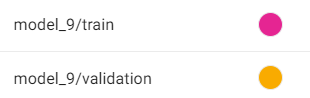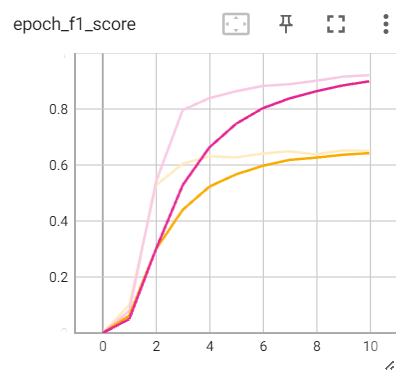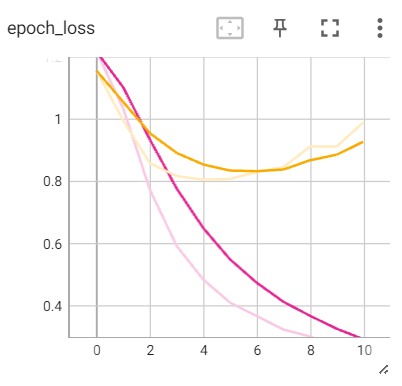

## Model Analysis

Despite the efforts to augment the data, the model still end up overfitting a lot to the training dataset.

This is probably due to the fact that despite the augmentation, the augmenter preserved certain keywords that is crucial to the tweet, making the model still learn the same few words despite being different sentences (The word "tooth fairy" is always present in the paraphrases). Other than that, from the example in the previous section, it can also be seen that some words are cut off acros all paraphrase such as the word "Global Warming", which might cause some information loss.Thus, the augmenter will not be kept.

# Model 10 : Reduced batch size
According to Goodfellow (2016), smaller batch sizes provides a regularization effect. Thus, the batch size is reduced to see if the model would stop overfitting.

In [ ]:
BATCH_SIZE=16
btrain_generator_aug = BTDataGenerator(train, batch_size=BATCH_SIZE)
bval_generator = BTDataGenerator(val, batch_size=BATCH_SIZE, augment=None)

In [ ]:
model_10 = bertweet_model3(bertweet_tokenizer, bertweet).assemble_full_model()

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_10.compile(optimizer=optimizer,
                loss="categorical_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])

In [ ]:
name_m10 = 'models/model_10'
training=True

callbacks, train_model = verify_training(name_m10, training,
                                         early_stopping=True,
                                         metric='val_f1_score',
                                         patience_num=15)

if train_model:
  print(f'Training model with BERTweet')
  history = model_10.fit(x=btrain_generator_aug,
                        validation_data=bval_generator,
                        callbacks=callbacks,
                        epochs=epochs)

Training model with BERTweet
Epoch 1/30
126/126 [==============================] - ETA: 0s - loss: 1.0154 - f1_score: 0.2449
Epoch 1: val_loss improved from inf to 0.91515, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_10/
126/126 [==============================] - 246s 2s/step - loss: 1.0154 - f1_score: 0.2449 - val_loss: 0.9152 - val_f1_score: 0.4273
Epoch 2/30
126/126 [==============================] - ETA: 0s - loss: 0.4355 - f1_score: 0.9020
Epoch 2: val_loss improved from 0.91515 to 0.83336, saving model to /content/drive/My Drive/RMIT/COSC2779/a2models/model_10/
126/126 [==============================] - 146s 1s/step - loss: 0.4355 - f1_score: 0.9020 - val_loss: 0.8334 - val_f1_score: 0.6486
Epoch 3/30
126/126 [==============================] - ETA: 0s - loss: 0.2505 - f1_score: 0.9302
Epoch 3: val_loss did not improve from 0.83336
126/126 [==============================] - 70s 555ms/step - loss: 0.2505 - f1_score: 0.9302 - val_loss: 0.9798 - val_f1_score:

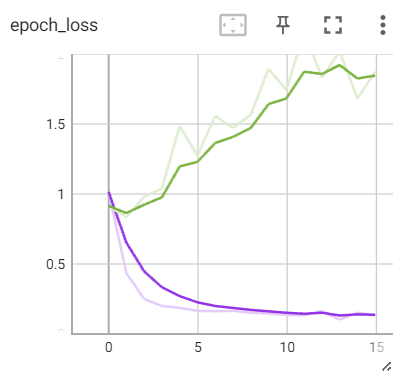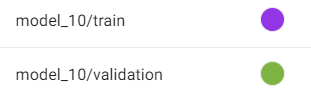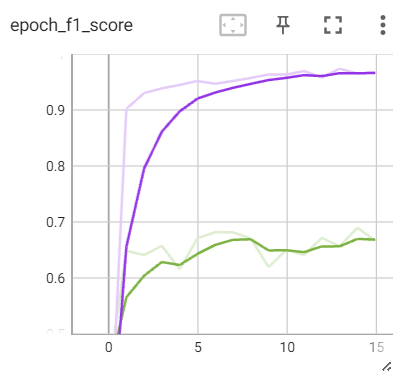

## Model Analysis
Similar to Model 9, the model overfitted early on during training and continued so over the training.

# Model 11: No Oversampling or UnderSampling
It is hypothesized that the reason the model overfitted so early is because a majority of the data is oversampled, making the model memorize the training set which make it perform badly on the validation set. Thus, the model would be trained without the oversampled and undersampled data to see if this mitigates the overfitting issue and improve the performance.  

The model architecture will be modified to have a Dense Layer of 128 units with ReLu activation to learn about the BERTweet embeddings. A Dropout layer is also added to prevent overfitting.

In [ ]:
train_ori['Stance'] = train_ori['Stance'].apply(lambda x : stance_encoding[x])
btrain_ori_generator = BTDataGenerator(train_ori, batch_size=BATCH_SIZE)

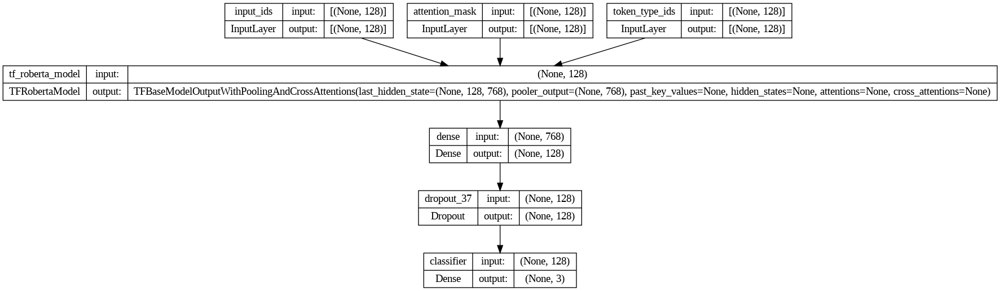

In [ ]:
class bertweet_model_test(bertweet_model):

  def assemble_full_model(self):
    input_ids = tf.keras.Input(shape=(128,), dtype='int32',name='input_ids')
    token_type_ids = tf.keras.Input(shape=(128,), dtype='int32',name='token_type_ids')
    attention_masks = tf.keras.Input(shape=(128,), dtype='int32',name='attention_mask')
    inputs = [input_ids,token_type_ids, attention_masks]

    x = self.encoder(inputs)

    bert_outputs = x.pooler_output


    net = tf.keras.layers.Dense(128, activation='relu')(bert_outputs)

    net = tf.keras.layers.Dropout(0.6)(net)
    net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
    return tf.keras.Model(inputs, net)


model_testing = bertweet_model_test(bertweet_tokenizer, bertweet).assemble_full_model()
tf.keras.utils.plot_model(model_testing, show_shapes=True)

Since the dataset is now imbalanced, the categorical cross entropy loss will be changed to Focal Categorical cross entropy loss to accomodate the imbalanced dataset.

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

model_testing.compile(optimizer=optimizer,
                loss="categorical_focal_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])


name_mtest = 'models/model_test'
training=False

callbacks, train_model = verify_training(name_mtest, training,
                                         early_stopping=True,
                                         metric='val_loss',
                                         patience_num=10)


if train_model:
  print(f'Training model with BERTweet')
  history = model_testing.fit(x=btrain_ori_generator,
                            validation_data=bval_generator,
                            callbacks=callbacks,
                            epochs=epochs)

Existing training files found, training stopped


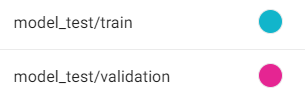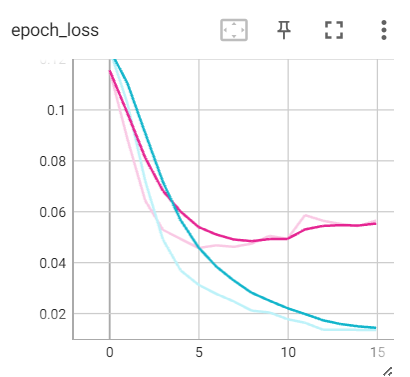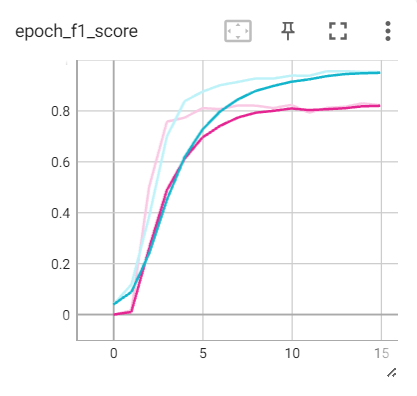

## Model Analysis

Although the model ended up overfitting, the model was able to reach a validation performance of 74% without overfitting around epoch 6. Due to limited computing resources and time, this model will be considered as the best model and the model at epoch 6 will be used to evaluate the Testing Set.

# Model results
Model 11's checkpoint will now be loaded and used for testing to see if the model is suitable for deployment.

In [ ]:
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

In [ ]:
new_model = bertweet_model_test(bertweet_tokenizer, bertweet).assemble_full_model()
new_model.load_weights('/content/drive/My Drive/RMIT/COSC2779/a2models/model_test2/')

new_model.compile(optimizer=optimizer,
                loss="categorical_focal_crossentropy",
                metrics=[tfa.metrics.F1Score(num_classes=3,
                                             threshold=0.5,
                                             average='macro')])


To allow the test result to be analysed, the Data Generator will be modified to return the tweets and the targets.

In [ ]:
class BTestDataGenerator(BTDataGenerator):
  def __getitem__(self, index):
    # Get all indexes of text for this batch
    indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

    # get the nth text from the batched indexes
    data_ids_temp = [self.text_ids[k] for k in indexes]

    # get the nth labels from the batched indexes
    label_temp = [self.labels[k] for k in indexes]


    target, tweet, X, y = self.__data_generation(data_ids_temp,
                                  label_temp)

    # {'input_ids':input_ids, 'token_type_ids':token_type_ids, 'attention_mask':attention_mask}
    return target, tweet, X, y

  def __data_generation(self, data_ids_temp, label_temp):
    input_ids = np.empty((self.batch_size, *self.dim),dtype=int)
    token_type_ids = np.empty((self.batch_size, *self.dim),dtype=int)
    attention_mask = np.empty((self.batch_size, *self.dim),dtype=int)

    targets = [None]*self.batch_size
    tweets = [None]*self.batch_size
    y = np.empty((self.batch_size),dtype=int)

    # Populate all data into the empty arrays
    for i,ids in enumerate(data_ids_temp):
      target,tweet, data = self.__read_data_instance(data_ids_temp[i])

      input_ids[i,] = data['input_ids'].numpy()
      token_type_ids[i,] = data['token_type_ids'].numpy()
      attention_mask[i,] = data['attention_mask'].numpy()

      targets[i] = target
      tweets[i] = tweet

      y[i] = label_temp[i]

    return targets, tweets, [input_ids, token_type_ids, attention_mask], keras.utils.to_categorical(y, num_classes=self.n_classes)

  def __read_data_instance(self, pid):
    target = self.dataframe.iloc[pid]['Target']
    tweet = self.dataframe.iloc[pid]['Tweet']

    if self.augment is not None:
      tweet = self.augment(tweet)

    target = self.normalize(target)
    tweet = self.normalize(tweet)


    tokens = self.tokenizer(tweet,
                       target,
                       padding="max_length",
                       truncation=True,
                       return_tensors = 'tf',
                       return_token_type_ids=True).data


    return target, tweet, tokens

# Source: COSC2779 Week 5 Lab Exercse

In [ ]:
btest_generator_mod = BTestDataGenerator(test_csv, batch_size=BATCH_SIZE, augment=None)

In [ ]:
targets = []
tweets = []
predictions = []
labels = []
data = []
oh_labels = []
for i in range(1):
  for target, tweet, X, y in btest_generator_mod.__iter__():
    # image = image
    # target = target
    prediction = new_model.predict(X,verbose=0)
    output = np.argmax(prediction, axis=1)
    label = np.argmax(y, axis=1)

    data.extend(X)
    oh_labels.extend(y)

    targets += target
    tweets += tweet
    predictions.extend(output)
    labels.extend(label)
    # AU_output = np.round(prediction[1])
    # AU_label = label[1]

In [ ]:
for target, tweet, X, y in btest_generator_mod.__iter__():
  X = X
  y = y
    # prediction = new_model.predict(X)

In [ ]:
new_model.evaluate(X,y)

1/1 [==============================] - 0s 381ms/step - loss: 0.0922 - f1_score: 0.6311


[0.09224104136228561, 0.6310558915138245]

From above, it can be seen that the model had a 63% performance on the testing generator. Let's take a closer look at this by checking the percentage of accurate preedictions of the model on different Target and Stance.

In [ ]:
pred_df = pd.DataFrame(predictions, columns=['Stance'])
# label_df = pd.DataFrame(y)
pred_df['Target'] = targets
pred_df['Tweet'] = tweets

label_df = pd.DataFrame(labels, columns=['Stance'])
label_df['Target'] = targets
label_df['Tweet'] = tweets

pred_df.head()

,Stance,Target,Tweet
0,2,Feminist Movement,Does it involve women ? It 's sexist . Does it...
1,2,Donald Trump,Trump for prez he could n't do any worse so gi...
2,0,Donald Trump,@USER @USER u cant lift sanctions & then slap ...
3,0,Donald Trump,@USER All these shootings in America are plann...
4,1,Donald Trump,@USER is the only candidate who has the backbo...


In [ ]:
actual_dict = {target:{'FAVOR':0, 'AGAINST':0, 'NONE':0} for target in test_csv['Target'].unique()}

for a in label_df[['Stance','Target']].value_counts().items():
  target = a[0][1]
  # print(a[0][0])
  stance = stance_encoding_lst[a[0][0]]


  actual_dict[target][stance] = a[1]
# [ for a in label_df.value_counts().items()]

In [ ]:
actual_dict

{'Atheism': {'FAVOR': 32, 'AGAINST': 160, 'NONE': 28},
 'Climate Change is a Real Concern': {'FAVOR': 122, 'AGAINST': 11, 'NONE': 35},
 'Feminist Movement': {'FAVOR': 58, 'AGAINST': 183, 'NONE': 44},
 'Hillary Clinton': {'FAVOR': 45, 'AGAINST': 172, 'NONE': 78},
 'Legalization of Abortion': {'FAVOR': 46, 'AGAINST': 188, 'NONE': 45},
 'Donald Trump': {'FAVOR': 147, 'AGAINST': 299, 'NONE': 259}}

In [ ]:
performance_dict = {target:{'FAVOR':0, 'AGAINST':0, 'NONE':0} for target in test_csv['Target'].unique()}

for i in range(len(pred_df.index)):
  if pred_df['Stance'][i] == label_df['Stance'][i]:
    target = pred_df['Target'][i]
    stance = stance_encoding_lst[pred_df['Stance'][i]]
    performance_dict[target][stance] += 1

In [ ]:
performance_dict

{'Atheism': {'FAVOR': 25, 'AGAINST': 120, 'NONE': 17},
 'Climate Change is a Real Concern': {'FAVOR': 116, 'AGAINST': 0, 'NONE': 21},
 'Feminist Movement': {'FAVOR': 41, 'AGAINST': 100, 'NONE': 23},
 'Hillary Clinton': {'FAVOR': 19, 'AGAINST': 145, 'NONE': 44},
 'Legalization of Abortion': {'FAVOR': 32, 'AGAINST': 109, 'NONE': 28},
 'Donald Trump': {'FAVOR': 30, 'AGAINST': 156, 'NONE': 146}}

In [ ]:
percentage_dict = {target:{'FAVOR':0, 'AGAINST':0, 'NONE':0} for target in test_csv['Target'].unique()}
percentage_dict = {target: {stance:performance_dict[target][stance] / actual_dict[target][stance] if actual_dict[target][stance]>0 else -1 for stance in performance_dict[target]}for target in performance_dict}

In [ ]:
percentage_dict

{'Atheism': {'FAVOR': 0.78125, 'AGAINST': 0.75, 'NONE': 0.6071428571428571},
 'Climate Change is a Real Concern': {'FAVOR': 0.9508196721311475,
  'AGAINST': 0.0,
  'NONE': 0.6},
 'Feminist Movement': {'FAVOR': 0.7068965517241379,
  'AGAINST': 0.546448087431694,
  'NONE': 0.5227272727272727},
 'Hillary Clinton': {'FAVOR': 0.4222222222222222,
  'AGAINST': 0.8430232558139535,
  'NONE': 0.5641025641025641},
 'Legalization of Abortion': {'FAVOR': 0.6956521739130435,
  'AGAINST': 0.5797872340425532,
  'NONE': 0.6222222222222222},
 'Donald Trump': {'FAVOR': 0.20408163265306123,
  'AGAINST': 0.5217391304347826,
  'NONE': 0.5637065637065637}}

In [ ]:
favor = [percentage_dict[target]['FAVOR'] for target in percentage_dict.keys()]
against = [percentage_dict[target]['AGAINST'] for target in percentage_dict.keys()]
none = [percentage_dict[target]['NONE'] for target in percentage_dict.keys()]

Text(0.5, 1.0, 'Percentage of correct predictions on Testing set')

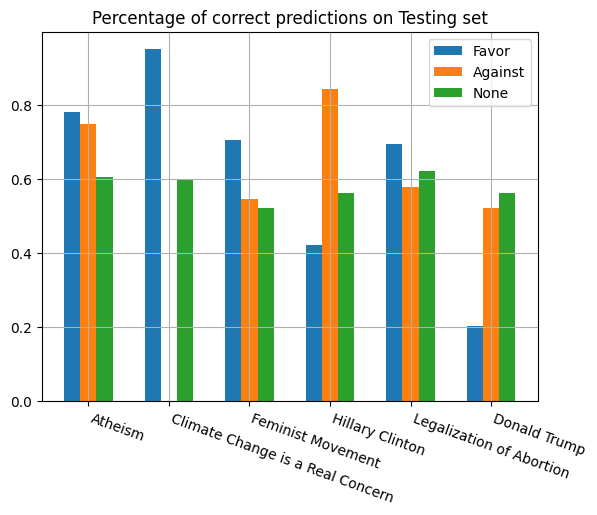

In [ ]:
x = np.arange(6)
width=0.2
plt.bar(x-0.2,favor,width, label='Favor')
plt.bar(x,against,width, label='Against')
plt.bar(x+0.2,none,width, label='None')
plt.xticks(x,percentage_dict.keys(),rotation=-20, ha='left')
plt.grid()
plt.legend()
plt.title("Percentage of correct predictions on Testing set")

From above, it can be seen that the model did pretty well (over 60%) on FAVOR for majority of the topics except for the topic DT and HC while the performance on stance "NONE" are stable across all topics (around 50% to 60%). The model performed well on stance "Against" for topic AT and HC, performed alright on topic FM, LA and DT. The model had 0 correct predictions for data of stance "AGAINST" for topic CC.

**CC | AGAINST**  
One of the possible reason why the model did not perform well on data for Target CC and Stance 'AGAINST' even though the model is tuned to accept an imbalanced dataset is that the model did not consider the Target when training as it is one of the input data. Without the Target, data with stance 'AGAINST' is considered to be the majority of the dataset instead!

**DT**  
It is surprising to see that the model managed to achieve roughly 50% accuracy despite never been trained on any data related to this Target. However, that is not the case for data with stance 'FAVOR'.

## CC | AGAINST
Let's take a look at some of the data for Target CC and Stance AGAINST.

In [ ]:
against_pat = test_csv['Stance']==2
cc_pat = test_csv['Target'] == 'Climate Change is a Real Concern'

against_pat_trn = train_csv['Stance']=='AGAINST'
cc_pat_trn = train_csv['Target'] == 'Climate Change is a Real Concern'

In [ ]:
test_csv[against_pat & cc_pat]['Tweet'].values

array(['ONE Volcano emits more pollution than man has in our HISTORY! #SemST',
       '@UN ice cracking in the summer?? SO ALARMING. #climatechangehoax #SemST',
       '#ClimateChangeDefinitions "settled science" = flawed computer models with jiggered data to force a predefined conclusion. #SemST',
       '@Myrmecos Still a larval theory. Still poorly modelled. Still unquantified. Still multi-factor. Still flummoxed by albedo. #SemST',
       'Climate deniers is a term used to silence those pointing out the hypocrisy in the fanatical zeal on  #climatetruth #SemST',
       '@wattsupwiththat yes ironic that the alarmists are the actual "deniers #SemST',
       "@JustinTrudeau Hey Justin I will give you 50 cents if you stop talking about climate 'Change' #Ottawa #davidsuzuki #cbc #SemST",
       "If @EPA & @POTUS don't have to follow SCOTUS why should anyone else have to #ClimateFraud #SpecialReport #WakeUpAmerica #SemST",
       'Govt announcement on zero carbon homes "short-sighted, unn

In [ ]:
train_csv[against_pat_trn & cc_pat_trn]['Tweet'].values

array(['The Climate Change people are disgusting assholes. Money transfer scheme for elite. May you rot.   #SemST',
       'BREAKING: This just in, an ocean wave just broke an inch further on the beach than normal! #SemST',
       'Climate change?! Explain the definition of climate change.. #fraud #CCOT #liberty #CruzCrew #SemST',
       'Last time I checked, Al Gore is a politician, not a scientist.. #WCS15 #SemST',
       "I'm sick of celebrities who think being a well known actor makes them an authority on anything else. #robertredford #UN #SemST",
       '[Man] cannot change the climate of any country; he adds no new element to the soil ~ Charles Darwin #anthropocene #SemST',
       'RedScareBot: Simple Malarkey RT gingerdr Global Warming/Climate Change all a HOAX. Communist agenda for control #sustainabil... #SemST',
       'Artic Ice highest in 10 years for the month of June..yet no headlines.. #scam #SemST',
       'Noted climatologist, marine biologist,& oceanographer Ted Danso

Looking at the data for Target CC and Stance AGAINST for both the training and testing set, it can be seen that the vocabulary is very different, with the test set mentioning words such as computers, volcano, carbon, killing earth while the training set focus more on climate change and global warming. It is also surprising to see that there are 3 nearly identical tweets "GlblWarmingNews And the tooth fairy..." with slight tweaks. It explains why the model could not perform well on this data due to it being too scarce and varied.

## DT | FAVOR

In [ ]:
favor_pat = test_csv['Stance']==1
dt_pat = test_csv['Target'] == 'Donald Trump'

In [ ]:
test_csv[favor_pat & dt_pat]['Tweet'].values[:15]

array(["Donald Trump isn't afraid to roast everyone. #SemST",
       'Donald Trump for president? I can dig it.  #SemST',
       '@USAlivestrong @scottscameron @ljmljm55 @blondygirl1 @eavesdropann @autumkat @texasflutegal 100% Support #Trump.. #SemST',
       "Considering the fact that Bush was a president of this country, I don't see it a joke that Trump is running ! #Election2016 #SemST",
       '@realDonaldTrump  I like Mexicans who come to US legally.  #IStandWithTrump #SemST',
       'We need Obama out and @realDonaldTrump in the White House ASAP #SemST',
       "#presidentialelection2016  Make plans to help your future now, so that later you don't regret it, again! Vote @realDonaldTrump #SemST",
       "Trump for prez he couldn't do any worse so give him a shot #SemST",
       '@realDonaldTrump No more Bush or Hillary Clinton #SemST',
       'Been slacking on my @realDonaldTrump retweets.. had some catching up to do .. #Trumpforpresident #SemST',
       '@realDonaldTrump You have

From above, it can be seen that there are some tweets without the name "Donald Trump" in it, which may hinder the model's performance. Other than that, it is hard to assess the model's performance as it did not train any of the related tweets.

## Real-World Data
To test the model on real world data, ChatGPT is used to generate some topics never seen by the model and some tweets and those tweets will be used to simulate how the model performs on real-world data.

In [ ]:
tweets = {
    "Environmental Crisis": {
        "FAVOR": [
            "We are destroying our environment, and we must act urgently to combat climate change. #ClimateAction",
            "Conservation efforts are essential to protect the Earth's biodiversity and natural beauty. #ConservationMatters",
            "Transitioning to renewable energy sources is key to reducing our carbon footprint and ensuring a sustainable future. #RenewableEnergy",
            "Our oceans and marine life are suffering due to single-use plastic pollution. Let's reduce plastic waste. #PlasticFree",
            "Environmental education is vital to raise awareness and cultivate a greener mindset. #EcoEducation"
        ],
        "AGAINST": [
            "Environmental regulations can hinder economic growth and job opportunities. We need to find a balance. #EnvironmentalRegulations",
            "The extent of human impact on climate change is debatable. Let's consider all perspectives. #ClimateDebate",
            "Conservation efforts often prioritize animals over people. We should focus on human well-being first. #HumanVsNature",
            "Renewable energy sources are costly and unreliable. Fossil fuels may remain a practical choice. #EnergyDebate",
            "Single-use plastic bans can have unintended consequences. We should explore alternatives. #PlasticBanDebate"
        ],
        "NONE": [
            "The environmental crisis is a multifaceted issue. Let's explore different aspects to understand its complexities. #EnvironmentalComplexity",
            "I'm still learning about environmental matters. It's an evolving field with many nuances. #EnvironmentalLearning",
            "Balancing environmental concerns with economic growth is a challenge. It requires thoughtful discussion. #EnvironmentAndEconomy",
            "I'm open to discussions on the environment. Let's engage in constructive conversations to find common ground. #EnvironmentalDialogue",
            "We need to consider both the environment and human welfare to address global challenges effectively. #EnvironmentAndSociety"
        ]
    },
    "Political Discourse": {
        "FAVOR": [
            "Active political engagement is the cornerstone of a democratic society. Let's exercise our right to vote and make our voices heard. #PoliticalEngagement",
            "Supporting politicians who champion social justice and equity is vital for creating a fair and inclusive society. #SocialJustice",
            "Transparency and accountability in government are essential for building public trust. #GovernmentAccountability",
            "Civil discourse is the path to bridging political divides and finding common ground. Let's engage in constructive conversations. #CivilDiscourse",
            "Participating in local politics can have a significant impact on our communities. Get involved! #LocalPoliticsMatters"
        ],
        "AGAINST": [
            "Political discourse is rife with corruption and self-interest, making it a broken system. #PoliticalDistrust",
            "Political polarization is tearing our society apart, and extremism is thriving. It's a dangerous trend. #PoliticalPolarization",
            "Politicians often make empty promises to gain votes. Can we trust any of them? #PoliticalPromises",
            "Government surveillance infringes on our privacy rights and freedoms, raising concerns. #PrivacyRights",
            "Political gridlock prevents meaningful change. It's time to break the cycle of stagnation. #PoliticalGridlock"
        ],
        "NONE": [
            "Political discourse is a complex realm with various perspectives. It's essential to stay informed and engage critically. #PoliticalComplexity",
            "I'm still exploring political ideologies and finding where I stand. It's an ongoing journey of discovery. #PoliticalExploration",
            "Finding common ground in politics can be challenging, but it's worth the effort. Let's have open and respectful discussions. #PoliticalDialogue",
            "Let's have open conversations about politics and seek to understand different viewpoints. #PoliticalDiscussion",
            "Political apathy is a concern, but we can work together to revitalize civic engagement. #PoliticalParticipation"
        ]
    },
    "Gender Equality": {
        "FAVOR": [
            "Gender equality benefits everyone, creating a fairer and more inclusive society. Let's empower women and girls. #GenderEquality",
            "Equal pay for equal work is a fundamental principle. It's time to close the gender pay gap. #EqualPay",
            "Dismantling patriarchal norms is essential for achieving gender equity. Let's challenge traditional gender roles. #BreakTheNorms",
            "Supporting women's reproductive rights is a matter of bodily autonomy and choice. #ReproductiveRights",
            "Gender-sensitive education is vital to combat stereotypes and promote respect and understanding. #GenderEducation"
        ],
        "AGAINST": [
            "Gender equality efforts often favor women at the expense of men. True equality should benefit both genders. #EqualityForAll",
            "The gender pay gap is a myth perpetuated by flawed statistics. There are valid reasons for income disparities. #PayGapDebate",
            "Traditional gender roles are rooted in biology and have value. We shouldn't dismiss them entirely. #GenderRoles",
            "Abortion goes against my religious beliefs. It's a moral issue, not just a matter of rights. #ProLife",
            "Gender-sensitive education can be overly politicized and biased. We should focus on objective teaching. #EducationBias"
        ],
        "NONE": [
            "Gender equality is a multifaceted issue. Let's explore different aspects to understand its complexities. #GenderEqualityComplexity",
            "I'm still learning about gender equality and the challenges faced by various gender identities. It's a journey of empathy and understanding. #GenderEqualityLearning",
            "Balancing the rights and needs of all genders is a delicate task. Let's engage in respectful dialogue. #GenderEqualityDialogue",
            "It's important to listen to diverse perspectives on gender equality, even if we haven't formed a firm stance yet. #GenderEqualityDiscussion",
            "Empathy and open conversations are key to finding common ground in discussions about gender equality. #EmpathyMatters"
        ]
    },
    "Religious Beliefs": {
        "FAVOR": [
            "Religion provides a moral compass and a sense of purpose for many people. It's a source of strength and guidance. #FaithMatters",
            "Interfaith dialogue can promote tolerance and understanding among different religious groups. Let's build bridges and foster peace. #InterfaithDialogue",
            "Religious organizations often play a vital role in charitable work and community support, making a positive impact. #ReligiousCharity",
            "Religious freedom is a fundamental human right. We should protect the right to practice one's faith without discrimination. #ReligiousFreedom",
            "Spiritual beliefs can provide solace and comfort during challenging times. It's a personal choice. #SpiritualComfort"
        ],
        "AGAINST": [
            "Religion can be a source of division and conflict, with a history of causing wars and strife. We must be cautious about its impact. #ReligiousConflict",
            "Interfaith dialogue is often ineffective and may perpetuate religious intolerance. It's better to keep faiths separate to avoid friction. #NoInterfaith",
            "Religious organizations should pay taxes like any other entity. Their special treatment is unfair and raises questions. #TaxReligions",
            "Religious freedom is sometimes used as an excuse to discriminate against marginalized groups. We must address this concern. #ReligiousDiscrimination",
            "Religious beliefs can sometimes hinder critical thinking and personal growth. It's important to encourage open-mindedness and exploration. #ReligiousCritique"
        ],
        "NONE": [
            "Religion is a deeply personal matter, and people have diverse views. Let's respect each other's beliefs and foster understanding. #ReligionRespect",
            "I'm still exploring my spiritual beliefs and haven't settled on a particular faith or philosophy. It's an ongoing journey of self-discovery. #SpiritualExploration",
            "Interfaith dialogue can be valuable in building bridges, but it also has its challenges. Let's discuss its merits and limitations openly. #InterfaithDiscussion",
            "Religious freedom is important, but it can raise complex legal and ethical questions. Let's delve into these issues to find a balanced approach. #ReligiousFreedomDebate",
            "Religion and spirituality are complex topics, and it's essential to approach them with an open mind and empathy. #ReligiousUnderstanding"
        ]
    }
}


In [ ]:
import pandas as pd

# Convert the tweets dictionary into a list of dictionaries
tweets_list = []

for topic, stances in tweets.items():
    for stance, tweets in stances.items():
        for tweet in tweets:
            tweets_list.append({"Target": topic, "Stance": stance, "Tweet": tweet})

# Create a Pandas DataFrame from the list of tweets
df = pd.DataFrame(tweets_list)

# Source: ChatGPT

In [ ]:
df['Stance'] = df['Stance'].apply(lambda x : stance_encoding[x])
df.head()

,Target,Stance,Tweet
0,Environmental Crisis,1,"We are destroying our environment, and we must..."
1,Environmental Crisis,1,Conservation efforts are essential to protect ...
2,Environmental Crisis,1,Transitioning to renewable energy sources is k...
3,Environmental Crisis,1,Our oceans and marine life are suffering due t...
4,Environmental Crisis,1,Environmental education is vital to raise awar...


In [ ]:
df_generator = BTDataGenerator(df, batch_size=BATCH_SIZE, augment=None)

In [ ]:
new_model.evaluate(df_generator)

1/1 [==============================] - 0s 439ms/step - loss: 0.1459 - f1_score: 0.3349


[0.14591465890407562, 0.33492064476013184]

From above, it can be seen that the model did not perform well on unseen data, with F1 score of onlyl 33%. Let's take a closer look.

In [ ]:
df_generator_mod = BTestDataGenerator(df, batch_size=BATCH_SIZE, augment=None)

In [ ]:
targets = []
tweets = []
predictions = []
labels = []
data = []
oh_labels = []
for i in range(1):
  for target, tweet, X, y in df_generator_mod.__iter__():
    # image = image
    # target = target
    prediction = new_model.predict(X,verbose=0)
    output = np.argmax(prediction, axis=1)
    label = np.argmax(y, axis=1)

    data.extend(X)
    oh_labels.extend(y)

    targets += target
    tweets += tweet
    predictions.extend(output)
    labels.extend(label)
    # AU_output = np.round(prediction[1])
    # AU_label = label[1]

In [ ]:
pred_df = pd.DataFrame(predictions, columns=['Stance'])
# label_df = pd.DataFrame(y)
pred_df['Target'] = targets
pred_df['Tweet'] = tweets

label_df = pd.DataFrame(labels, columns=['Stance'])
label_df['Target'] = targets
label_df['Tweet'] = tweets

In [ ]:
actual_dict = {target:{'FAVOR':0, 'AGAINST':0, 'NONE':0} for target in df['Target'].unique()}

for a in label_df[['Stance','Target']].value_counts().items():
  target = a[0][1]
  # print(a[0][0])
  stance = stance_encoding_lst[a[0][0]]


  actual_dict[target][stance] = a[1]
actual_dict

{'Environmental Crisis': {'FAVOR': 2, 'AGAINST': 4, 'NONE': 4},
 'Political Discourse': {'FAVOR': 1, 'AGAINST': 4, 'NONE': 2},
 'Gender Equality': {'FAVOR': 3, 'AGAINST': 3, 'NONE': 2},
 'Religious Beliefs': {'FAVOR': 2, 'AGAINST': 3, 'NONE': 2}}

In [ ]:
performance_dict = {target:{'FAVOR':0, 'AGAINST':0, 'NONE':0} for target in df['Target'].unique()}

for i in range(len(pred_df.index)):
  if pred_df['Stance'][i] == label_df['Stance'][i]:
    target = pred_df['Target'][i]
    stance = stance_encoding_lst[pred_df['Stance'][i]]
    performance_dict[target][stance] += 1

performance_dict

{'Environmental Crisis': {'FAVOR': 2, 'AGAINST': 0, 'NONE': 0},
 'Political Discourse': {'FAVOR': 1, 'AGAINST': 1, 'NONE': 2},
 'Gender Equality': {'FAVOR': 3, 'AGAINST': 0, 'NONE': 0},
 'Religious Beliefs': {'FAVOR': 1, 'AGAINST': 2, 'NONE': 0}}

In [ ]:
percentage_dict = {target:{'FAVOR':0, 'AGAINST':0, 'NONE':0} for target in test_csv['Target'].unique()}
percentage_dict = {target: {stance:performance_dict[target][stance] / actual_dict[target][stance] if actual_dict[target][stance]>0 else -1 for stance in performance_dict[target]}for target in performance_dict}

In [ ]:
favor = [percentage_dict[target]['FAVOR'] for target in percentage_dict.keys()]
against = [percentage_dict[target]['AGAINST'] for target in percentage_dict.keys()]
none = [percentage_dict[target]['NONE'] for target in percentage_dict.keys()]

Text(0.5, 1.0, "Model Performance on 'Real-world' Data")

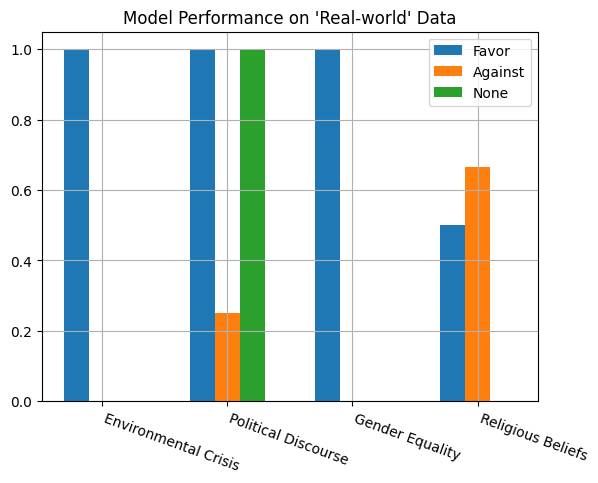

In [ ]:
x = np.arange(4)
width=0.2
plt.bar(x-0.2,favor,width, label='Favor')
plt.bar(x,against,width, label='Against')
plt.bar(x+0.2,none,width, label='None')
plt.xticks(x,percentage_dict.keys(),rotation=-20, ha='left')
plt.grid()
plt.legend()
plt.title("Model Performance on 'Real-world' Data")

From above, it can be seen that the model performed best on the Target 'Political Discourse' while having very bad performance on Target 'Environmental Crisis' and 'Gender Equality', with a value of 1 for these topic could indicate that the model predicts every data of this Target to be FAVOR. The model performed alright with the topic Religious Beliefs for Stance FAVOR and AGAINST.  

The model results are in line with the training as Target HC could touch a lot on political tweets. On the other hand, the model did not do well on Target 'Environmental Crisis' as there are minimal data related to Target CC. On the other hand, Target AT could have aid in the model's performance on Target 'Religious Beliefs'.  

This suggests the model has the potential to perform well on certain topics. However, this would only happen if the model is trained on related topics, indicating that in order for such models to perform well on any topic, the model has to be trained on a little bit of everything, meaning a very large set of data.

To improve the current model, there are several ideas that could be tried out in the future such as collecting more data for training, higher model capacity or better data augmentation techniques.